# Test RNN sur le déjeuner - diner
avec prise en compte de l'identité utilisateur pour les repas
test de l'intégration du user embedding (état caché initial ou à chaque étape) vs controle sans intégration du user embedding.

Apprendre des clusters d'utilisateurs avec BPR et utiliser le profil du cluster pour intégrer user embedding dans le RNN

Attention!!!!  il sagit du notebook execute sur google colab (pour pouvoir utiliser la bpr loss dans la factorisation matricielle bpr => du coup il y a des PROBLEMES D INDENTATION signalés en rouge dus au passage sur google colab, il faudra les corriger ici)

Source utilisée pour la programmation dans ce notebook :
"Module 4 : RNN et attention pour le texte", Auteur: Vincent Guigue
https://github.com/vguigue/tuto_deep/blob/main/notebooks/4_1-rnn-gen.ipynb

In [1]:
!pip install torchtext
from packaging import version
from pathlib import Path
from itertools import chain
from typing import Iterable, List, Tuple

import shutil
import torchtext
assert version.Version(torchtext.__version__) >= version.Version("0.9.0")
import torch
from torch import nn
import torch.nn.functional as F
from torch import optim
from torch.utils.data import DataLoader, Dataset
from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from torchtext.data.utils import get_tokenizer
from torchtext.vocab import vocab, FastText
from collections import Counter
from tqdm.autonotebook import tqdm
from torch.nn.utils.rnn import pad_sequence
import sentencepiece as spm
from IPython.display import display, HTML
import os


cachepath = os.path.expanduser('~/.local/data')
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# outils avancés de gestion des chemins
BASEPATH = Path("xp/generation")
TB_PATH =  BASEPATH / "logs"
TB_PATH.mkdir(parents=True, exist_ok=True)

# usage externe de tensorboard: (1) lancer la commande dans une console; (2) copier-coller l'URL dans un navigateur
display(HTML("<h2>Informations</h2><div>Pour visualiser les logs, tapez la commande : </div>"))
print(f"tensorboard --logdir {Path(TB_PATH).absolute()}")

<ipython-input-1-546d20819140>:20: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


tensorboard --logdir /content/xp/generation/logs


In [ ]:
%reload_ext tensorboard
%tensorboard --logdir /content/xp/generation/logs

<IPython.core.display.Javascript object>

In [61]:
!pip install sentencepiece
!pip install datasets
!pip install fsspec==2021.8.1
!pip uninstall huggingface-hub

  Using cached fsspec-2023.6.0-py3-none-any.whl (163 kB)
  Using cached huggingface_hub-0.17.2-py3-none-any.whl (294 kB)
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2021.8.1
    Uninstalling fsspec-2021.8.1:
      Successfully uninstalled fsspec-2021.8.1


  Using cached fsspec-2021.8.1-py3-none-any.whl (119 kB)
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2023.6.0
    Uninstalling fsspec-2023.6.0:
      Successfully uninstalled fsspec-2023.6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2023.8.1 requires fsspec>=2021.09.0, but you have fsspec 2021.8.1 which is incompatible.
datasets 2.14.5 requires fsspec[http]<2023.9.0,>=2023.1.0, but you have fsspec 2021.8.1 which is incompatible.
gcsfs 2023.6.0 requires fsspec==2023.6.0, but you have fsspec 2021.8.1 which is incompatible.


Found existing installation: huggingface-hub 0.17.2
Uninstalling huggingface-hub-0.17.2:
  Would remove:
    /usr/local/bin/huggingface-cli
    /usr/local/lib/python3.10/dist-packages/huggingface_hub-0.17.2.dist-info/*
    /usr/local/lib/python3.10/dist-packages/huggingface_hub/*
Proceed (Y/n)? Y
  Successfully uninstalled huggingface-hub-0.17.2


# A. Chargement des données

In [2]:
#ADAPTATION EXERSYS
import pickle
with open("/REP_vraisalimfreqliste.pkl", "rb") as fichier:
    REP_vraisalimfreqliste = pickle.load(fichier)

In [3]:
#ADAPTATION EXERSYS
print(REP_vraisalimfreqliste[:20])

[['28301', '9811', '7001', '18008', '19611', '13030', '16632', '81007'], ['20047', '11110', '22501', '39221', '18008', '7001', '81007'], ['25163', '9811', '19640', '18008', '7001', '13037'], ['8400', '25103', '9104', '7001', '19640', '18008', '11110'], ['36005', '20071', '7001', '18008', '19611', '13014', '81007', '81007'], ['28925', '20071', '11110', '7001', '18008', '39221', '81007'], ['36306', '20101', '4003', '17440', '28504', '11081', '7001', '19640', '18008', '81007', '81007'], ['28900', '7001', '19624', '18008'], ['6210', '20030', '7001', '23525', '18008'], ['26034', '25606', '11110', '7001', '23525', '18008'], ['25902', '28916', '76057', '19640', '13039', '7100'], ['9811', '13039', '19700', '76022', '11114'], ['20009', '1007', '25902', '9811', '11114', '12114', '18009', '81061'], ['25902', '25103', '9104', '12114', '18008', '7001', '81029', '81009'], ['25906', '8400', '25606', '11110', '19700', '7001', '18008', '13037'], ['9811', '11107', '81022'], ['76061', '13034', '20051', '

In [4]:
#ADAPTATION EXERSYS
#Créer des jeux de training, validation, set

import random
import pickle
data=REP_vraisalimfreqliste

# # Define the proportions for train, validation, and test datasets (as percentages)
# train_ratio = 0.7
# validation_ratio = 0.15
# test_ratio = 0.15

# # Calculate the number of samples for each dataset
# num_samples = len(data)
# num_train = int(num_samples * train_ratio)
# num_validation = int(num_samples * validation_ratio)
# num_test = num_samples - num_train - num_validation

# # Shuffle the data randomly
# random.shuffle(data)

# # Split the data into three datasets: train, validation, and test
# train_data = data[:num_train]
# validation_data = data[num_train:num_train + num_validation]
# test_data = data[num_train + num_validation:]


# # Save the train_data using pickle
# with open('train_data.pkl', 'wb') as f:
#     pickle.dump(train_data, f)

# # Save the validation_data  using pickle
# with open('validation_data.pkl', 'wb') as g:
#     pickle.dump(validation_data, g)

# # Save the test_data using pickle
# with open('test_data.pkl', 'wb') as h:
#     pickle.dump(test_data, h)

# Load the train_data from the saved file
with open('/train_data.pkl', 'rb') as f:
    train_data = pickle.load(f)

# Load the validation_data from the saved file
with open('/validation_data.pkl', 'rb') as g:
    validation_data = pickle.load(g)

# Load the test_data from the saved file
with open('/test_data.pkl', 'rb') as h:
    test_data = pickle.load(h)

# Now, 'train_data', 'validation_data', and 'test_data' contain the respective datasets
print("Train Data:", train_data[:20])
print("Validation Data:", validation_data[:20])
print("Test Data:", test_data[:20])

# Convertir les sous-listes en phrases (chaînes de caractères)
train_data_sentences = [' '.join(sublist) for sublist in train_data]
validation_data_sentences = [' '.join(sublist) for sublist in validation_data]
test_data_sentences = [' '.join(sublist) for sublist in test_data]
print(train_data_sentences[:2])

all_sentences = []
all_sentences.extend(train_data_sentences)
all_sentences.extend(validation_data_sentences)
all_sentences.extend(test_data_sentences)
print(len(all_sentences))

Train Data: [['5206', '20047', '12115', '13034', '7001', '11017', '81063'], ['76020'], ['25405', '36005', '4018', '23490', '18066', '5206', '18004'], ['25410', '28916', '18066', '12100', '22010', '13008'], ['9811', '12114', '18066', '18017'], ['6255', '20030', '5210', '18008'], ['20009', '6999', '9822', '13005', '76056', '81024', '81008', '81063'], ['9811', '28504', '19402', '13024', '18066', '81009'], ['9811', '12020', '13014', '31016', '18008'], ['13037', '19760', '76020'], ['30742', '4010', '90068', '23477', '7001', '18066', '18004'], ['9811', '6255', '11107', '20035', '5001', '5205', '7110', '81007', '81007'], ['4003', '20030', '17270', '26025', '5205', '90068', '13039', '7001', '18004', '81052', '81022', '81007', '81006', '81007', '81006'], ['25002', '9104', '7001', '19628', '81024', '81009'], ['18066', '6200', '4018', '90068', '23585', '7001'], ['26015', '17440', '25031', '13044', '5205', '18008', '7001', '18004', '31016', '81022'], ['25902', '19606', '18008', '81052'], ['1006', 

In [5]:
# Aplatir la liste de listes
aplatie = [item for sublist in REP_vraisalimfreqliste for item in sublist]
# Obtenir les valeurs uniques
features = list(set(aplatie))

print(len(features))
print(features)

335
['11054', '9104', '9081', '20001', '20098', '30300', '28916', '26039', '19765', '16632', '2007', '19420', '17700', '5210', '25081', '20172', '20125', '4019', '90057', '28401', '20008', '90068', '7255', '20101', '20210', '81063', '25606', '81002', '19624', '22500', '13024', '25089', '92031', '12115', '26046', '1005', '28301', '18044', '81007', '18009', '1010', '11107', '20495', '25608', '13034', '6550', '36018', '20030', '23585', '11003', '25088', '90119', '6999', '20051', '81012', '20015', '19510', '81010', '4006', '92051', '13030', '12045', '12110', '81042', '13004', '81008', '6520', '36004', '7012', '28800', '4027', '6255', '19850', '81038', '19602', '36205', '18073', '30742', '20099', '19730', '11108', '17270', '36005', '1007', '4010', '31016', '1006', '18008', '90069', '1003', '26025', '12009', '8001', '36202', '25524', '25002', '76057', '11014', '5207', '25604', '11158', '7001', '13005', '11030', '36306', '6200', '18060', '25103', '26023', '25512', '81037', '25947', '39208', '

# B. Preprocessing

In [6]:

#ADAPTATION EXERSYS
class Preprocessor:
    def process_batch(self, batch: List[str]):
        return pad_sequence([self.string2idx(text) for text in batch])

class SentencePiecePreprocessor(Preprocessor):
    """Tokenizer Sentence Piece"""
    def embeddings(self, dimension: int):
        return nn.Embedding(self.vocab_size, dimension, padding_idx=self.pad_index)

    @property
    def vocab_size(self):
        return self.spm_tokenizer.vocab_size()

    def __init__(self, name: str, sentences: Iterable[str], vocab_size=len(features)+4, force=False):
        modelpath = BASEPATH / f"{name}-{vocab_size}.model"
        if not modelpath.exists() or force:
            print(f"Entraînement de SPM, sortie {BASEPATH}/{name}-{vocab_size}", flush=True)
            spm.SentencePieceTrainer.train(
                sentence_iterator=iter(sentences),
                model_prefix=f"{BASEPATH}/{name}-{vocab_size}",
                vocab_size=vocab_size,
                model_type="word",
                pad_id=0,
                unk_id=1,
                bos_id=2,
                eos_id=3
            )

        self.spm_tokenizer = spm.SentencePieceProcessor()
        self.spm_tokenizer.load(str(modelpath))

        self.pad_index = self.spm_tokenizer.pad_id()
        self.eos_index = self.spm_tokenizer.eos_id()
        self.bos_index = self.spm_tokenizer.bos_id()
        self.oov_index = None

        self.spm_tokenizer.SetEncodeExtraOptions("bos:eos")

    def string2idx(self, s: str) -> torch.Tensor:
        return torch.tensor(self.spm_tokenizer.EncodeAsIds(s))

    def tokenizer(self, x):
        """Segmentation du texte en sous-mots"""
        return self.spm_tokenizer.encode_as_pieces(x)

    def id2token(self, ix):
        return self.spm_tokenizer.IdToPiece(ix)

    def decode(self, ids: List[int]):
        return self.spm_tokenizer.Decode(ids)


preprocessor = SentencePiecePreprocessor("spm", all_sentences, force=False)
print(f"Vocabulary size: {preprocessor.vocab_size}")

Entraînement de SPM, sortie xp/generation/spm-339
Vocabulary size: 339


In [7]:
#ADAPTATION EXERSYS
# exemple de décomposition
preprocessor.tokenizer(['25902 25019 13039 5210 13005 18066'])

[['<s>', '▁25902', '▁25019', '▁13039', '▁5210', '▁13005', '▁18066', '</s>']]

In [8]:
#ADAPTATION EXERSYS
out = preprocessor.process_batch(['25902 25019 13039 5210 13005 18066']) # => tenseur d'indices présenté en colonne
print(out)
print(out.shape)

tensor([[  2],
        [ 17],
        [113],
        [ 11],
        [ 51],
        [ 32],
        [  5],
        [  3]])
torch.Size([8, 1])


In [ ]:
#ADAPTATION EXERSYS
# transformation inverse (index => token)
# attention (toujours aux dimensions) : si on oublie le squeeze => list de token

print(preprocessor.decode(out.tolist()))
print(preprocessor.decode(out.squeeze().tolist()))

['', '25902', '25019', '13039', '5210', '13005', '18066', '']
25902 25019 13039 5210 13005 18066


In [ ]:
#ADAPTATION EXERSYS
# reflexion sur le padding
x_exemple = preprocessor.process_batch(['25902 25019 13039 5210 13005 18066', '28925 20066 20047 11110 12115 9811 9811 9811'])

print("Dimension de x :", x_exemple.size()) # T x batch_size x dim_input
print(x_exemple)

Dimension de x : torch.Size([10, 2])
tensor([[  2,   2],
        [ 17, 180],
        [113, 158],
        [ 11,  14],
        [ 51,  18],
        [ 32, 138],
        [  5,   7],
        [  3,   7],
        [  0,   7],
        [  0,   3]])


In [ ]:
#ADAPTATION EXERSYS
# récupération automatique d'une lookup table (tableau d'embeddings):
embeddings = preprocessor.embeddings(50) # taille vaocabulaire x dim = 50

print("taille de la table:", embeddings.num_embeddings, "x", embeddings.embedding_dim)

taille de la table: 339 x 50


In [ ]:
#ADAPTATION EXERSYS
# verification sur la nature de la représentation du mot de padding

x = embeddings(preprocessor.process_batch(['25902 25019 13039 5210 13005 18066', '28925 20066 20047 11110 12115 9811 9811 9811']))
print("Dimension de x :", x.size()) # T x batch_size x dim_input
print("mot :", x[9,0,:].data) # 9e mot du doc 0 (toutes les dimensions de la représentation)

Dimension de x : torch.Size([10, 2, 50])
mot : tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.])


In [ ]:
# avant entrainement du modèle
z = embeddings(preprocessor.process_batch(['25902']))
print("Dimension de z :", z.size())
print(z)

Dimension de z : torch.Size([3, 1, 50])
tensor([[[ 1.3749, -0.8125,  1.4249,  0.4585,  0.1057, -1.0082,  1.1179,
           0.8327,  0.1201,  0.8923,  0.5946,  0.9276,  0.4544, -0.6387,
           1.3188,  1.6178,  0.8457,  0.1210, -0.0503,  0.0922, -0.4320,
          -0.6997, -0.4772, -0.6807, -0.9946,  0.7547, -0.5677,  0.4694,
           0.1605, -0.2666,  1.0335,  0.9379,  0.0318, -1.6428, -0.7637,
           1.0541, -2.5984, -0.7315,  1.2499,  0.4212, -1.4539,  0.7911,
          -1.2214, -0.5598, -1.4925, -0.4376,  0.5514,  0.8215,  0.9148,
           0.1699]],

        [[ 2.5989, -0.8572,  0.0972, -0.8542, -0.9607,  0.0778, -0.6295,
           1.1954,  1.6021,  0.7728,  0.2431,  0.3142, -1.3650, -0.5571,
          -0.0660, -0.7378, -1.4272, -0.2971,  2.4327, -0.2205,  0.7031,
           0.3904, -0.4577,  0.1796, -1.0801,  1.2974,  1.2830,  0.2528,
           0.8811, -1.4513,  0.6019,  1.1398, -0.5457, -0.8302,  3.2223,
           0.4526,  0.2707,  0.7356, -0.4615, -0.1716, -0.0878

In [9]:
#Vérifier la bonne tokenisation de tous les aliments
rand_vec=0
for token_id in range(preprocessor.vocab_size):
    token = preprocessor.id2token(token_id)
    print(token)
    if token.startswith("▁"):
        if not str(token[1:]) in features:
            rand_vec+=1
            print("token not in model:", token)


<pad>
<unk>
<s>
</s>
▁7001
▁18066
▁18008
▁9811
▁18004
▁25604
▁81024
▁13039
▁81008
▁28916
▁20047
▁81009
▁31016
▁25902
▁11110
▁16400
▁17270
▁9104
▁90068
▁81022
▁6255
▁12114
▁81052
▁11018
▁5205
▁19600
▁81007
▁5203
▁13005
▁13024
▁12999
▁36005
▁4003
▁6200
▁18018
▁81025
▁7100
▁76020
▁7012
▁19628
▁22010
▁11017
▁20009
▁20062
▁4027
▁19624
▁22500
▁5210
▁4010
▁25903
▁13037
▁20030
▁81011
▁4005
▁81010
▁81006
▁25516
▁28101
▁17440
▁13034
▁11108
▁18044
▁11107
▁20026
▁81061
▁13026
▁28301
▁81029
▁11054
▁36306
▁20031
▁76056
▁19402
▁8211
▁5206
▁76016
▁30300
▁20035
▁20210
▁92044
▁4019
▁11013
▁20008
▁26030
▁4018
▁26039
▁26140
▁19800
▁92024
▁13044
▁28504
▁11015
▁25018
▁76057
▁18071
▁25405
▁18009
▁12500
▁28800
▁4006
▁20021
▁81042
▁19606
▁20003
▁17001
▁19640
▁19765
▁13043
▁20071
▁25019
▁36004
▁81038
▁12001
▁20011
▁20027
▁11109
▁6210
▁19501
▁22501
▁25127
▁11000
▁19510
▁30780
▁20099
▁23499
▁13014
▁25608
▁16402
▁5001
▁36018
▁11014
▁23490
▁25002
▁81012
▁12115
▁20017
▁20036
▁25056
▁17700
▁39200
▁13030
▁20045
▁81037

In [10]:
#detecter les erreurs de tokenisation par sentencepiece
import copy
features_miss=copy.deepcopy(features)
for token_id in range(preprocessor.vocab_size):
    token = preprocessor.id2token(token_id)
    if token.startswith("▁"):
        features_miss.remove(str(token[1:]))
print(features_miss)

[]


In [11]:
import pickle

filename = "/dic_userseqrepas.pkl"
with open(filename, "rb") as file:
    dic_userseqrepas = pickle.load(file)

print(dic_userseqrepas)

{110006: [['28301', '9811', '7001', '18008', '19611', '13030', '16632', '81007'], ['20047', '11110', '22501', '39221', '18008', '7001', '81007'], ['25163', '9811', '19640', '18008', '7001', '13037'], ['8400', '25103', '9104', '7001', '19640', '18008', '11110'], ['36005', '20071', '7001', '18008', '19611', '13014', '81007', '81007'], ['28925', '20071', '11110', '7001', '18008', '39221', '81007'], ['36306', '20101', '4003', '17440', '28504', '11081', '7001', '19640', '18008', '81007', '81007'], ['28900', '7001', '19624', '18008'], ['6210', '20030', '7001', '23525', '18008'], ['26034', '25606', '11110', '7001', '23525', '18008']], 110007: [['25902', '28916', '76057', '19640', '13039', '7100']], 110020: [['9811', '13039', '19700', '76022', '11114'], ['20009', '1007', '25902', '9811', '11114', '12114', '18009', '81061']], 110021: [['25902', '25103', '9104', '12114', '18008', '7001', '81029', '81009'], ['25906', '8400', '25606', '11110', '19700', '7001', '18008', '13037']], 110025: [['9811',

In [12]:
import copy
import numpy as np

# print(dic_userseqrepas)
dic_userseqrepas_min3=copy.deepcopy(dic_userseqrepas)
for cle, valeur in dic_userseqrepas.items():
        if len(valeur)<3:
#             print(cle, len(valeur))
            del dic_userseqrepas_min3[cle]

print(len(dic_userseqrepas))
print(len(dic_userseqrepas_min3))

dic_user_repas_train={}
dic_user_repas_valid={}
dic_user_repas_test={}
for cle, valeur in dic_userseqrepas_min3.items():
    r=0
    for repas in valeur:
        r+=1
        if r<len(valeur)-1:
            dic_user_repas_train.setdefault(cle, []).append(repas)
        elif r==len(valeur)-1:
            dic_user_repas_valid.setdefault(cle, []).append(repas)
        elif r==len(valeur):
            dic_user_repas_test.setdefault(cle, []).append(repas)
# dic_user_repas_train

train_data_old=[]
train_user_ids=[]
valid_data_old=[]
valid_user_ids=[]
test_data_old=[]
test_user_ids=[]

for cle, valeur in dic_user_repas_train.items():
    for repas in valeur:
        train_data_old.append(repas)
        train_user_ids.append(cle)
# print(len(train_data_old))
# print(len(train_user_ids))

for cle, valeur in dic_user_repas_valid.items():
    for repas in valeur:
        valid_data_old.append(repas)
        valid_user_ids.append(cle)
# print((valid_data_old))
# print((valid_user_ids))

for cle, valeur in dic_user_repas_test.items():
    for repas in valeur:
        test_data_old.append(repas)
        test_user_ids.append(cle)

print(len(np.unique(train_user_ids)))
print(len(np.unique(valid_user_ids)))
print(len(np.unique(test_user_ids)))


2385
1789
1789
1789
1789


# 3. Factorisation matricielle BPR

In [13]:
!pip install lightfm
import numpy as np
from lightfm import LightFM
import pickle
from lightfm import LightFM
from lightfm.data import Dataset

In [14]:
filename = "/dic_alim_group.pkl"
with open(filename, "rb") as file:
    dic_alim_group = pickle.load(file)

print(dic_alim_group)

{7001: 1, 7004: 1, 7012: 1, 7100: 1, 7110: 1, 7125: 1, 7126: 1, 7160: 1, 7200: 1, 7225: 1, 7255: 1, 90003: 1, 91123: 1, 92031: 1, 7300: 1, 7310: 1, 7330: 1, 7340: 1, 7400: 1, 7411: 1, 7425: 1, 92030: 1, 7430: 1, 7500: 1, 7812: 1, 32000: 2, 32002: 2, 32003: 2, 32005: 2, 32006: 2, 32021: 2, 32121: 2, 32133: 2, 32001: 2, 32009: 2, 32016: 2, 32022: 2, 32112: 2, 32115: 2, 32131: 2, 32135: 2, 32023: 2, 32110: 2, 32111: 2, 32113: 2, 32123: 2, 32004: 2, 32018: 2, 90032: 2, 9811: 3, 9822: 3, 9871: 3, 23412: 3, 23422: 3, 9081: 4, 9683: 4, 9103: 4, 9104: 4, 9105: 4, 9230: 5, 9313: 5, 9615: 5, 9660: 5, 7601: 6, 7615: 6, 7620: 6, 7650: 6, 7710: 6, 7720: 6, 7730: 6, 7740: 6, 7741: 6, 23480: 6, 24660: 6, 92510: 6, 24000: 7, 24002: 7, 24003: 7, 24015: 7, 24016: 7, 24031: 7, 24034: 7, 24036: 7, 24037: 7, 24038: 7, 24049: 7, 24231: 7, 24310: 7, 24320: 7, 24430: 7, 24441: 7, 24615: 7, 24659: 7, 24678: 7, 24684: 7, 92033: 7, 4004: 7, 38105: 7, 38106: 7, 38400: 7, 38401: 7, 38402: 7, 38403: 7, 31100: 7, 31

In [15]:
print(dic_user_repas_train)

{110006: [['28301', '9811', '7001', '18008', '19611', '13030', '16632', '81007'], ['20047', '11110', '22501', '39221', '18008', '7001', '81007'], ['25163', '9811', '19640', '18008', '7001', '13037'], ['8400', '25103', '9104', '7001', '19640', '18008', '11110'], ['36005', '20071', '7001', '18008', '19611', '13014', '81007', '81007'], ['28925', '20071', '11110', '7001', '18008', '39221', '81007'], ['36306', '20101', '4003', '17440', '28504', '11081', '7001', '19640', '18008', '81007', '81007'], ['28900', '7001', '19624', '18008']], 110025: [['9811', '11107', '81022']], 110034: [['25902', '7110', '90068', '13021'], ['22500', '17700', '4027', '90068', '13037'], ['25902', '12114', '13005'], ['30300', '7001', '26140', '17270', '4003', '90068', '13044', '5205'], ['25902', '12114', '13039']], 110046: [['7001', '5210', '20003', '6255', '12758', '13024', '81012', '81009', '81061'], ['5210', '7001', '25013', '20006', '12500', '13005', '81008', '81009'], ['5210', '7001', '25902', '28916', '25018',

In [16]:
# print(dic_user_repas_train)
dic_user_repas_5j={}
for cle, valeur in dic_user_repas_train.items():
    for repas in valeur:
        dic_user_repas_5j.setdefault(cle, []).extend(sublist for sublist in repas)


dic_foodgroup5j={}
for cle, valeur in dic_user_repas_5j.items():
    for e in valeur:
        dic_foodgroup5j.setdefault(cle, []).append(e)

for cle, valeur in dic_foodgroup5j.items():
    dic_foodgroup5j[cle]=list(np.unique(valeur))

dic_foodgroup5j

{110006: ['11081',
  '11110',
  '13014',
  '13030',
  '13037',
  '16632',
  '17440',
  '18008',
  '19611',
  '19624',
  '19640',
  '20047',
  '20071',
  '20101',
  '22501',
  '25103',
  '25163',
  '28301',
  '28504',
  '28900',
  '28925',
  '36005',
  '36306',
  '39221',
  '4003',
  '7001',
  '81007',
  '8400',
  '9104',
  '9811'],
 110025: ['11107', '81022', '9811'],
 110034: ['12114',
  '13005',
  '13021',
  '13037',
  '13039',
  '13044',
  '17270',
  '17700',
  '22500',
  '25902',
  '26140',
  '30300',
  '4003',
  '4027',
  '5205',
  '7001',
  '7110',
  '90068'],
 110046: ['12500',
  '12758',
  '13005',
  '13024',
  '19501',
  '20003',
  '20006',
  '20030',
  '20098',
  '25013',
  '25018',
  '25902',
  '26140',
  '28101',
  '28916',
  '5210',
  '6255',
  '7001',
  '81008',
  '81009',
  '81012',
  '81052',
  '81061'],
 110067: ['11018',
  '11110',
  '12747',
  '17440',
  '19501',
  '20003',
  '20013',
  '20047',
  '20495',
  '25600',
  '25604',
  '28301',
  '7001',
  '7255',
  '81024

In [17]:
# print(dic_user_repas_valid)
dic_user_repas_1j_val={}
for cle, valeur in dic_user_repas_valid.items():
    for repas in valeur:
        dic_user_repas_1j_val.setdefault(cle, []).extend(sublist for sublist in repas)


dic_foodgroup1j_val={}
for cle, valeur in dic_user_repas_1j_val.items():
    for e in valeur:
        dic_foodgroup1j_val.setdefault(cle, []).append(e)

for cle, valeur in dic_foodgroup1j_val.items():
    dic_foodgroup1j_val[cle]=list(np.unique(valeur))

dic_foodgroup1j_val

{110006: ['18008', '20030', '23525', '6210', '7001'],
 110025: ['13034', '20051', '36005', '76061', '81024', '81061'],
 110034: ['12114', '13021', '25902'],
 110046: ['12999',
  '13037',
  '20047',
  '4018',
  '5203',
  '6255',
  '7001',
  '81009',
  '81012',
  '81061'],
 110067: ['20035', '20066', '22500', '5206', '7001', '90068'],
 110071: ['18066', '25009'],
 110113: ['11110', '18066', '25405', '25604'],
 110125: ['18066', '25405', '7012', '92024'],
 110137: ['18066', '23000', '25914'],
 110147: ['25524', '28301', '76020', '81010', '9104'],
 110152: ['13039',
  '17440',
  '18066',
  '20047',
  '22010',
  '26023',
  '81024',
  '90068',
  '9081',
  '9104'],
 110167: ['25003', '5200'],
 110194: ['18066', '19430', '23490', '25947', '7100', '8320'],
 110207: ['11018', '13037', '17270', '25606', '25902', '26039', '76016'],
 110208: ['16400', '18018', '19624', '22500', '7001'],
 110264: ['13134', '19600', '25902', '81052'],
 110291: ['18066', '25908', '28916', '7001'],
 110298: ['18066', '

In [18]:
# print(dic_user_repas_test)
dic_user_repas_1j_test={}
for cle, valeur in dic_user_repas_test.items():
    for repas in valeur:
        dic_user_repas_1j_test.setdefault(cle, []).extend(sublist for sublist in repas)


dic_foodgroup1j_test={}
for cle, valeur in dic_user_repas_1j_test.items():
    for e in valeur:
        dic_foodgroup1j_test.setdefault(cle, []).append(e)

for cle, valeur in dic_foodgroup1j_test.items():
    dic_foodgroup1j_test[cle]=list(np.unique(valeur))

dic_foodgroup1j_test

{110006: ['11110', '18008', '23525', '25606', '26034', '7001'],
 110025: ['11113', '20098', '28916', '81024'],
 110034: ['13044', '17270', '20011', '6520', '81024', '90068'],
 110046: ['19501', '22500', '25604', '25902', '5210', '7001', '81052'],
 110067: ['11004',
  '11110',
  '20009',
  '20014',
  '20047',
  '20055',
  '30700',
  '7001'],
 110071: ['18004', '18060', '18066', '25127', '81052'],
 110113: ['13039', '18008', '20036', '28916', '81024'],
 110125: ['12115', '18066', '20047', '22500', '28504', '5203'],
 110137: ['11110', '13037', '20047', '5210', '7001', '92024'],
 110147: ['11081', '28301', '76056', '81010', '9811'],
 110152: ['13002', '18066', '25081', '90068'],
 110167: ['18066',
  '20035',
  '20047',
  '25604',
  '36302',
  '4010',
  '7001',
  '81024',
  '81025'],
 110194: ['13024', '18066', '19430', '23490', '25947'],
 110207: ['11110',
  '17270',
  '18008',
  '20027',
  '26039',
  '39206',
  '81010',
  '81011'],
 110208: ['18018', '20036', '25512', '81024'],
 110264: [

In [19]:
users = valid_user_ids
items = features

# Create an empty list to store the interaction data
interaction_data = []

# Iterate over each user and calculate the frequency of food consumption
for user in users:
    for item in items:
        if item in dic_foodgroup5j[user]:
            interaction_data.append((user, item))  # User has consumed the item

print(interaction_data)

# Create a Dataset object
dataset = Dataset()

# Fit the dataset with user and item IDs
dataset.fit(users, items)

# Build the interaction matrix
train_data, _ = dataset.build_interactions(interaction_data)
print(train_data)

[(110006, '9104'), (110006, '16632'), (110006, '20101'), (110006, '19624'), (110006, '28301'), (110006, '81007'), (110006, '13030'), (110006, '36005'), (110006, '18008'), (110006, '7001'), (110006, '36306'), (110006, '25103'), (110006, '28925'), (110006, '8400'), (110006, '22501'), (110006, '19640'), (110006, '13037'), (110006, '11110'), (110006, '39221'), (110006, '9811'), (110006, '11081'), (110006, '19611'), (110006, '17440'), (110006, '13014'), (110006, '28504'), (110006, '20047'), (110006, '20071'), (110006, '4003'), (110006, '25163'), (110006, '28900'), (110025, '11107'), (110025, '9811'), (110025, '81022'), (110034, '30300'), (110034, '17700'), (110034, '90068'), (110034, '22500'), (110034, '4027'), (110034, '17270'), (110034, '7001'), (110034, '13005'), (110034, '12114'), (110034, '25902'), (110034, '13021'), (110034, '7110'), (110034, '13039'), (110034, '13037'), (110034, '13044'), (110034, '26140'), (110034, '5205'), (110034, '4003'), (110046, '20098'), (110046, '28916'), (11

In [ ]:
# Définir les différentes valeurs d'hyperparamètres à tester
epochs = [10, 1000, 5000, 10000]
no_components = [10, 50, 100, 200]
learning_rates = [5, 1, 0.01, 0.001]

best_mrr = 0.0
best_params = {}

for epoch in epochs:
    for num_components in no_components:
        for learning_rate in learning_rates:
            # Créer un modèle LightFM avec les hyperparamètres actuels
            model = LightFM(loss='bpr', learning_rate=learning_rate, no_components=num_components)
            # Entraîner le modèle sur les données d'entraînement
            model.fit(train_data, epochs=epoch, num_threads=1)

            # Évaluer MRR
            total_mrr=0
            for user_idx, user_id in enumerate(users):
                train_prediction=model.predict(user_idx, list(range(len(items))))
                # print(train_prediction)
                items_tries = sorted(range(len(train_prediction)), key=lambda i: train_prediction[i], reverse=True)
                # print(items_tries)
                aliments_correspondants = []  # Une liste pour stocker les aliments correspondants aux indices
                for indice in items_tries:
                  if 0 <= indice < len(items):
                    aliment = items[indice]
                    aliments_correspondants.append(aliment)
                # print(aliments_correspondants)
                real_conso=dic_foodgroup1j_val[user_id]
                # print(real_conso)
                mrr = 0
                nbre_alim=0
                for consumption in real_conso:
                    nbre_alim+=1
                    if consumption in aliments_correspondants:
                        rank =  aliments_correspondants.index(consumption)
                        inverse_rank = 1/(rank+1)
                        mrr += inverse_rank
                mrr /= nbre_alim
                # print("mrr id", user_id, mrr)
                total_mrr+=mrr

            performance=total_mrr/len(users)
            print("MRR moyenne sur tous les utilisateurs:", total_mrr/len(users))

            if performance > best_mrr:
                best_mrr = performance
                best_params = {
                  'no_components': num_components,
                  'learning_rate': learning_rate,
                  'epochs': epoch
                  }

print("Meilleurs hyperparamètres :")
print(best_params)
print("Meilleure performance (MRR) :", best_mrr)

MRR moyenne sur tous les utilisateurs: 0.01275532492240497
MRR moyenne sur tous les utilisateurs: 0.057610184108898184
MRR moyenne sur tous les utilisateurs: 0.13113157211923232
MRR moyenne sur tous les utilisateurs: 0.12898521912964828
MRR moyenne sur tous les utilisateurs: 0.013435403128688902
MRR moyenne sur tous les utilisateurs: 0.052905496447669086
MRR moyenne sur tous les utilisateurs: 0.1303809937817923
MRR moyenne sur tous les utilisateurs: 0.12979551837169126
MRR moyenne sur tous les utilisateurs: 0.013616494589326785
MRR moyenne sur tous les utilisateurs: 0.06923641054942273
MRR moyenne sur tous les utilisateurs: 0.13061331291796582
MRR moyenne sur tous les utilisateurs: 0.12978357847392635
MRR moyenne sur tous les utilisateurs: 0.014253479757678725
MRR moyenne sur tous les utilisateurs: 0.07894779446885629
MRR moyenne sur tous les utilisateurs: 0.12970441068255759
MRR moyenne sur tous les utilisateurs: 0.12970913081526225
MRR moyenne sur tous les utilisateurs: 0.01354870467

KeyboardInterrupt: ignored

In [ ]:
print("Meilleurs hyperparamètres :")
print(best_params)
print("Meilleure performance (MRR) :", best_mrr)

In [ ]:
# On regarde la performance d'une combinaison d'hyperparamètres qui semble bonne au vu du grid search ci-dessus (grid search trop long, pas fini)
from tqdm import tqdm

epoch = 1000
no_components = 100
learning_rate = 0.01

best_mrr = 0.0
best_params = {}

# Créer un modèle LightFM avec les hyperparamètres actuels
model = LightFM(loss='bpr', learning_rate=learning_rate, no_components=no_components)
# Entraîner le modèle sur les données d'entraînement
model.fit(train_data, epochs=epoch, num_threads=1)

# Évaluer MRR
total_mrr=0
for user_idx, user_id in enumerate(users):
    train_prediction=model.predict(user_idx, list(range(len(items))))
    # print(train_prediction)
    items_tries = sorted(range(len(train_prediction)), key=lambda i: train_prediction[i], reverse=True)
    # print(items_tries)
    aliments_correspondants = []  # Une liste pour stocker les aliments correspondants aux indices
    for indice in items_tries:
      if 0 <= indice < len(items):
        aliment = items[indice]
        aliments_correspondants.append(aliment)
    # print(aliments_correspondants)
    real_conso=dic_foodgroup1j_val[user_id]
    # print(real_conso)
    mrr = 0
    nbre_alim=0
    for consumption in real_conso:
        nbre_alim+=1
        if consumption in aliments_correspondants:
            rank =  aliments_correspondants.index(consumption)
            inverse_rank = 1/(rank+1)
            mrr += inverse_rank
    mrr /= nbre_alim
    # print("mrr id", user_id, mrr)
    total_mrr+=mrr

performance=total_mrr/len(users)
print("MRR moyenne sur tous les utilisateurs:", total_mrr/len(users))

MRR moyenne sur tous les utilisateurs: 0.16721901525038746


In [20]:
#Evaluation de la performance sur l'ensemble test du modèle optimisé sur les hyperparamètres:
model_f = LightFM(loss='bpr', learning_rate=0.01, no_components=100)
model_f.fit(train_data, epochs=1000)

# Évaluer MRR
total_mrr=0
for user_idx, user_id in enumerate(users):
  train_prediction=model_f.predict(user_idx, list(range(len(items))))
  # print(train_prediction)
  items_tries = sorted(range(len(train_prediction)), key=lambda i: train_prediction[i], reverse=True)
  # print(items_tries)
  aliments_correspondants = []  # Une liste pour stocker les aliments correspondants aux indices
  for indice in items_tries:
    if 0 <= indice < len(items):
      aliment = items[indice]
      aliments_correspondants.append(aliment)
  # print(aliments_correspondants)
  real_conso=dic_foodgroup1j_test[user_id]
  # print(real_conso)
  mrr = 0
  nbre_alim=0
  for consumption in real_conso:
    nbre_alim+=1
    if consumption in aliments_correspondants:
      rank =  aliments_correspondants.index(consumption)
      inverse_rank = 1/(rank+1)
      mrr += inverse_rank
  mrr /= nbre_alim
  # print("mrr id", user_id, mrr)
  total_mrr+=mrr

performance=total_mrr/len(users)
print("MRR moyenne sur tous les utilisateurs:", total_mrr/len(users))

MRR moyenne sur tous les utilisateurs: 0.16190957879428422


In [ ]:
#performance d'un modèle de recommandation random
total_mrr=0

for user_idx, user_id in enumerate(users):
  real_conso=dic_foodgroup1j_test[user_id]
  mrr = 0
  for consumption in real_conso:
    mrr_e=0
    for k in range(1,336):
      inverse_rank=1/k
      mrr_e +=inverse_rank
    mrr_e /= 335
    mrr += mrr_e
  mrr /= len(real_conso)
  total_mrr+=mrr

performance=total_mrr/len(users)
print("MRR moyenne sur tous les utilisateurs:", total_mrr/len(users))

MRR moyenne sur tous les utilisateurs: 0.01908309848204477


In [21]:
user_biases, user_latentrep = model_f.get_user_representations()
# user_biases, user_latentrep = model.get_user_representations()

In [22]:
# exemple du user embedding appris par BPR pour l'individu "indice 3"
print(user_latentrep[3])

[-0.01010422 -0.33943543 -0.16299471 -0.31340688  0.0312423  -0.20028563
 -0.14059635  0.21012956  0.17799725 -0.50544536  0.15044858  0.37249336
  0.1862531   0.201138   -0.15113813 -0.22923288 -0.03996091 -0.16540633
 -0.30596787 -0.0007268   0.03707753  0.09037554 -0.14488098 -0.07544074
 -0.26289394  0.10312048 -0.2976659  -0.16645038  0.02691401 -0.25530332
  0.26757303  0.11175203 -0.5452209   0.45907858  0.1403473   0.1454264
 -0.04027684  0.36310917 -0.05951496 -0.3620526  -0.24839522 -0.35670236
  0.47679365  0.43034095 -0.2914184  -0.00372935  0.03994571 -0.17840505
  0.20830448  0.07257181  0.08953717 -0.49335662 -0.13913755 -0.13296288
 -0.06531321  0.18114288  0.24440672 -0.3017194   0.1017672   0.6403517
  0.08552625  0.07564837 -0.2834859  -0.30566314 -0.3370931  -0.33936605
 -0.2480573   0.265386    0.53636104 -0.37668556  0.01108395  0.06574734
  0.09482073  0.04201933 -0.29973105 -0.13081141 -0.35729477 -0.15408903
  0.09612676  0.2188641  -0.23127809 -0.13841799  0.2

In [23]:
# on crées les users embeddings avec pytorch, on imprime celui de l'individu indice 3
# et on initialise les users embeddings avec les users embeddings appris par BPR

us_emb = nn.Embedding(len(valid_user_ids), 100)
print("taille de la table avant:", us_emb.num_embeddings, "x", us_emb.embedding_dim)

print(us_emb.weight[3])

user_latentrep_tens=torch.tensor(user_latentrep, dtype=torch.float32)
print(us_emb.weight.shape)
print(user_latentrep_tens.shape)

us_emb.weight = torch.nn.Parameter(user_latentrep_tens)
print("taille de la table après:", us_emb.num_embeddings, "x", us_emb.embedding_dim)


taille de la table avant: 1789 x 100
tensor([ 2.2184,  0.9417,  0.4861, -0.7528, -1.3023,  1.1132,  0.2535,  0.0099,
        -0.4996, -1.9957,  0.2919,  0.2176,  0.3669,  1.6831, -0.9285, -1.1941,
         0.8014,  2.1327,  1.8407,  1.0091, -0.9867,  1.1963, -0.0806, -0.9431,
        -0.1245,  0.1102, -1.6346,  0.1844,  1.2553, -0.7778, -0.2329, -0.2402,
        -0.3691, -0.2009, -1.3530,  1.2486, -0.8885, -0.7333, -0.9631, -0.1903,
        -0.6700,  0.9176,  0.7345,  0.5098, -1.5191,  0.6837, -1.0964,  0.3327,
        -0.8107, -0.6701,  0.5672, -1.2355,  0.3458,  0.0376,  2.0598, -0.0729,
        -0.7663, -1.8105, -0.3269, -0.3688, -0.0103,  0.2457,  0.0120, -1.2141,
         0.3824,  1.2231, -0.0600, -0.5104,  0.3768,  1.3026,  1.5810, -3.0738,
         1.3452,  1.5222,  0.4977, -2.0351,  0.9891,  0.8035, -1.6683, -2.0731,
         0.8709, -0.2811, -0.7643,  0.6894,  1.4544, -1.0102, -0.2191, -0.5905,
         0.1943, -1.8480, -0.1961, -1.3716,  1.0776, -0.6020,  0.7879,  0.3443,
   

In [24]:
#  on vérifie leur bonne prIse ne compte avec l'exemple de l'individu "indice 3"
print(us_emb.weight[3])

tensor([-0.0101, -0.3394, -0.1630, -0.3134,  0.0312, -0.2003, -0.1406,  0.2101,
         0.1780, -0.5054,  0.1504,  0.3725,  0.1863,  0.2011, -0.1511, -0.2292,
        -0.0400, -0.1654, -0.3060, -0.0007,  0.0371,  0.0904, -0.1449, -0.0754,
        -0.2629,  0.1031, -0.2977, -0.1665,  0.0269, -0.2553,  0.2676,  0.1118,
        -0.5452,  0.4591,  0.1403,  0.1454, -0.0403,  0.3631, -0.0595, -0.3621,
        -0.2484, -0.3567,  0.4768,  0.4303, -0.2914, -0.0037,  0.0399, -0.1784,
         0.2083,  0.0726,  0.0895, -0.4934, -0.1391, -0.1330, -0.0653,  0.1811,
         0.2444, -0.3017,  0.1018,  0.6404,  0.0855,  0.0756, -0.2835, -0.3057,
        -0.3371, -0.3394, -0.2481,  0.2654,  0.5364, -0.3767,  0.0111,  0.0657,
         0.0948,  0.0420, -0.2997, -0.1308, -0.3573, -0.1541,  0.0961,  0.2189,
        -0.2313, -0.1384,  0.2010,  0.4452,  0.1199,  0.1015, -0.0879,  0.0254,
        -0.0030, -0.0704,  0.2067,  0.2390,  0.0182, -0.0711,  0.1831,  0.2381,
        -0.0463,  0.0885,  0.1080, -0.54

# C. RNN


In [25]:
#ADAPTATION EXERSYS
#adaptation avec user embedding : 2 façons de l'intégrer
# partie commune aux 2

import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

# Créez un dictionnaire pour mapper les user_ids aux indices
user_id_to_index = {user_id: index for index, user_id in enumerate(valid_user_ids)}
# print(user_id_to_index)

train_batchsize = 100
valid_batchsize = 20
test_batchsize = 1

train_data=[' '.join(sublist) for sublist in train_data_old]
# print(train_data)
valid_data=[' '.join(sublist) for sublist in valid_data_old]
# print(valid_data)
test_data=[' '.join(sublist) for sublist in test_data_old]
# print(test_data)


class CustomDataset(Dataset):
    def __init__(self, data, user_ids, user_id_to_index):
        self.data = data  # Les séquences de données
        self.user_ids = user_ids  # Les identifiants d'utilisateur
        self.user_id_to_index = user_id_to_index

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        # Retourner un tuple contenant la séquence et l'indice d'utilisateur
        user_id = self.user_ids[idx]
        user_index = self.user_id_to_index[user_id]
        return self.data[idx], user_index

train_dataset = CustomDataset(train_data, train_user_ids, user_id_to_index)
train_loader = DataLoader(train_dataset, train_batchsize, shuffle=True)

valid_dataset = CustomDataset(valid_data, valid_user_ids, user_id_to_index)
valid_loader = DataLoader(valid_dataset, valid_batchsize, shuffle=False)

test_dataset = CustomDataset(test_data, test_user_ids, user_id_to_index)
test_loader =  DataLoader(valid_dataset, test_batchsize, shuffle=False)

# for batch in train_loader:
#     sequences, user_indices = batch
#     print("Batch of Sequences:", sequences)
#     print("Batch of User Indices:", user_indices)

In [ ]:
# user_id_to_index

In [26]:
# charger dictionnaire des noms d'aliments
with open("/dic_alim.pkl", "rb") as fichier:
    dic_alim = pickle.load(fichier)

In [27]:
# charger dictionnaire des catégories d'aliments associées aux aliments (les catégories csontruites par connaissance expert)
with open("/dic_alimnonrare_cat_repas.pkl", "rb") as fichier:
    dic_alimnonrare_cat_repas = pickle.load(fichier)

In [28]:
# trouver clé à partir de valeur
def get_keys_by_value(dictionary, value):
    keys = []
    for key, val in dictionary.items():
        if value in val:
            keys.append(key)
    return keys

In [29]:
#retrouver une catégorie à partir d'un aliment
print(int(preprocessor.decode(17)))
get_keys_by_value(dic_alimnonrare_cat_repas, int(preprocessor.decode(17)))


25902


[('38',)]

In [ ]:
#ADAPTATION EXERSYS
#adaptation avec user embedding intégré comme état caché initial : LE USER EMBEDDING EST LA REPRENSENTATION DU USER DANS L ESPACE LATENT APPRISE PAR BPR
#loss minimale à n=13


def train_1to1(preprocessor, model, epochs):
    """Fonction d'entraînement (teacher forcing)"""
    print(f"Training {model.name}")

    # On nettoie le rep. de log
    shutil.rmtree(f"{TB_PATH}/{model.name}", ignore_errors = True)
    writer = SummaryWriter(f"{TB_PATH}/{model.name}")

    optim = torch.optim.Adam(model.parameters(), lr=1e-3)
    model = model.to(device)
    loss = nn.CrossEntropyLoss(ignore_index=preprocessor.pad_index)  # classification avec une classe qui ne retourne pas d'erreur

    for epoch in tqdm(range(epochs)):
        cumloss, count =  0, 0
        model.train()
        for batch in train_loader:
            sequences, user_index = batch
#             print(sequences)
#             print(user_index)
            optim.zero_grad()
            x = preprocessor.process_batch(sequences).to(device)
#             print(x)
            user_index = user_index.to(device)
            # Mode "Teacher forcing"
            x, y = x[:-1], x[1:]
            print(x.shape)
            print(model.user_embeddings(user_index).unsqueeze(0).shape)
            yhat, hidden = model.forward(x, model.user_embeddings(user_index).unsqueeze(0))
            l = loss(yhat.view(-1,yhat.size(2)), y.view(-1))
            l.backward()
            optim.step()
            cumloss += l*len(x)
            count += len(x)
        writer.add_scalar('loss/train', cumloss/count, epoch)

        if epoch % 1 == 0:
            model.eval()
            with torch.no_grad():
                cumloss, count = 0, 0
                for batch in valid_loader:
                    sequences, user_index = batch
                    x = preprocessor.process_batch(sequences).to(device)
                    user_index = user_index.to(device)
                    x, y = x[:-1], x[1:]
                    yhat, hidden = model(x, model.user_embeddings(user_index).unsqueeze(0))
                    cumloss += loss(yhat.view(-1,yhat.size(2)),y.view(-1))*len(x)
                    count += len(x)
                writer.add_scalar(f'loss/test',cumloss/count,epoch)

class RNN(nn.Module):
    def __init__(self, embeddings, user_embeddings, hidden_dim):
        super().__init__()
        self.name = f"rnn-{embeddings.embedding_dim}-{hidden_dim}"
        self.embeddings = embeddings
        self.user_embeddings = user_embeddings
        self.rnn = nn.RNN(embeddings.embedding_dim, hidden_dim, nonlinearity="tanh")
        self.fc = nn.Linear(hidden_dim, embeddings.num_embeddings)
        # </CORRECTION>

    def forward(self, x, h_0):
        x = self.embeddings(x)
        output, hidden = self.rnn(x, h_0)
        return self.fc(output), hidden


# On récupère des embeddings pour le modèle
embeddings = preprocessor.embeddings(100)

# Création du RNN avec 100 états cachés
rnn_model = RNN(embeddings, us_emb, 100)

# Entraînement du modèle:
train_1to1(preprocessor, rnn_model, 13)

Training rnn-100-100


  0%|          | 0/13 [00:00<?, ?it/s]

torch.Size([13, 100])
torch.Size([1, 100, 100])
torch.Size([13, 100])
torch.Size([1, 100, 100])
torch.Size([16, 100])
torch.Size([1, 100, 100])
torch.Size([16, 100])
torch.Size([1, 100, 100])
torch.Size([17, 100])
torch.Size([1, 100, 100])
torch.Size([15, 100])
torch.Size([1, 100, 100])
torch.Size([16, 100])
torch.Size([1, 100, 100])
torch.Size([14, 100])
torch.Size([1, 100, 100])
torch.Size([16, 100])
torch.Size([1, 100, 100])
torch.Size([13, 100])
torch.Size([1, 100, 100])
torch.Size([14, 100])
torch.Size([1, 100, 100])
torch.Size([13, 100])
torch.Size([1, 100, 100])
torch.Size([16, 100])
torch.Size([1, 100, 100])
torch.Size([17, 100])
torch.Size([1, 100, 100])
torch.Size([14, 100])
torch.Size([1, 100, 100])
torch.Size([15, 100])
torch.Size([1, 100, 100])
torch.Size([15, 100])
torch.Size([1, 100, 100])
torch.Size([18, 100])
torch.Size([1, 100, 100])
torch.Size([17, 100])
torch.Size([1, 100, 100])
torch.Size([18, 100])
torch.Size([1, 100, 100])
torch.Size([14, 100])
torch.Size([1, 100

In [30]:
# ADAPTATION EXERSYS
#adaptation avec user embedding intégré comme à chaque étape  LE USER EMBEDDING EST LA REPRENSENTATION DU USER DANS L ESPACE LATENT APPRISE PAR BPR
#loss minimale à n=8

def train_1to1(preprocessor, model, epochs):
    """Fonction d'entraînement (teacher forcing)"""
    print(f"Training {model.name}")

    # On nettoie le rep. de log
    shutil.rmtree(f"{TB_PATH}/{model.name}", ignore_errors = True)
    writer = SummaryWriter(f"{TB_PATH}/{model.name}")

    optim = torch.optim.Adam(model.parameters(), lr=1e-3)
    model = model.to(device)
    loss = nn.CrossEntropyLoss(ignore_index=preprocessor.pad_index)  # classification avec une classe qui ne retourne pas d'erreur

    for epoch in tqdm(range(epochs)):
        cumloss, count =  0, 0
        model.train()
        for batch in train_loader:
            sequences, user_index = batch
#             print(sequences)
#             print(user_index)
            optim.zero_grad()
            x = preprocessor.process_batch(sequences).to(device)
#             print(x)
            user_index = user_index.to(device)
            # Mode "Teacher forcing"
            x, y = x[:-1], x[1:]
            print(x.shape)
            yhat, hidden = model.forward(x, user_index)
            l = loss(yhat.view(-1,yhat.size(2)), y.view(-1))
            l.backward()
            optim.step()
            cumloss += l*len(x)
            count += len(x)
        writer.add_scalar('loss/train', cumloss/count, epoch)

        if epoch % 1 == 0:
            model.eval()
            with torch.no_grad():
                cumloss, count = 0, 0
                for batch in valid_loader:
                    sequences, user_index = batch
                    x = preprocessor.process_batch(sequences).to(device)
                    user_index = user_index.to(device)
                    x, y = x[:-1], x[1:]
                    yhat, hidden = model(x, user_index)
                    cumloss += loss(yhat.view(-1,yhat.size(2)),y.view(-1))*len(x)
                    count += len(x)
                writer.add_scalar(f'loss/test',cumloss/count,epoch)

class RNN(nn.Module):
    def __init__(self, embeddings,  user_embeddings, hidden_dim):
        super().__init__()
        self.name = f"rnn-{embeddings.embedding_dim}-{hidden_dim}"
        self.embeddings = embeddings
        self.user_embeddings = user_embeddings
        self.rnn = nn.RNN(embeddings.embedding_dim + user_embeddings.embedding_dim, hidden_dim, nonlinearity="tanh")
        self.fc = nn.Linear(hidden_dim, embeddings.num_embeddings)


    def forward(self, x, user_index, h_0=None):
        # Obtenir l'embedding de l'utilisateur correspondant
        user_embedding = self.user_embeddings(user_index)
        # Concaténer l'embedding de l'utilisateur avec les séquences à chaque étape
        x_with_user = torch.cat([self.embeddings(x), user_embedding.unsqueeze(0).expand(x.size(0), -1, -1)], dim=-1)
        # Passez les données concaténées à travers le RNN
        output, hidden = self.rnn(x_with_user, h_0)
        # Passez la sortie à travers la couche linéaire pour obtenir les prédictions
        return self.fc(output), hidden


# On récupère des embeddings pour le modèle
embeddings = preprocessor.embeddings(100)


# Création du RNN avec 100 états cachés
rnn_model = RNN(embeddings, us_emb, 100)

# Entraînement du modèle:
train_1to1(preprocessor, rnn_model, 8)

Training rnn-100-100


  0%|          | 0/8 [00:00<?, ?it/s]

torch.Size([15, 100])
torch.Size([15, 100])
torch.Size([16, 100])
torch.Size([15, 100])
torch.Size([19, 100])
torch.Size([17, 100])
torch.Size([16, 100])
torch.Size([14, 100])
torch.Size([15, 100])
torch.Size([15, 100])
torch.Size([15, 100])
torch.Size([17, 100])
torch.Size([13, 100])
torch.Size([17, 100])
torch.Size([14, 100])
torch.Size([14, 100])
torch.Size([13, 100])
torch.Size([14, 100])
torch.Size([14, 100])
torch.Size([14, 100])
torch.Size([19, 100])
torch.Size([20, 100])
torch.Size([16, 100])
torch.Size([15, 100])
torch.Size([15, 100])
torch.Size([16, 100])
torch.Size([19, 100])
torch.Size([13, 100])
torch.Size([16, 100])
torch.Size([20, 100])
torch.Size([15, 100])
torch.Size([13, 100])
torch.Size([18, 100])
torch.Size([15, 100])
torch.Size([15, 100])
torch.Size([16, 100])
torch.Size([18, 100])
torch.Size([12, 100])
torch.Size([16, 100])
torch.Size([25, 100])
torch.Size([21, 100])
torch.Size([17, 100])
torch.Size([16, 100])
torch.Size([15, 100])
torch.Size([13, 100])
torch.Size

In [ ]:
us_emb.weight[3]

tensor([-0.1847, -0.1024, -0.2631, -0.2630, -0.0035, -0.3810, -0.0763,  0.2841,
         0.4338, -0.0536,  0.5674,  0.0206,  0.1832,  0.0898,  0.0300,  0.7465,
         0.1334, -0.2162, -0.0049,  0.1427,  0.2542,  0.0466, -0.1898,  0.0869,
         0.3113,  0.3020, -0.5163, -0.8175,  0.1837,  0.2077,  0.1195, -0.3620,
        -0.5757,  0.2525, -0.0991, -0.3891, -0.5616, -0.0049, -0.0532,  0.0028,
         0.2887,  0.2680,  0.0445,  0.3249,  0.2205, -0.0865, -0.1560, -0.1253,
        -0.0330, -0.5123,  0.1372, -0.1761,  0.1570,  0.0529, -0.5380, -0.1255,
         0.2434, -0.1357,  0.1097,  0.1500,  0.3359, -0.3178,  0.2238,  0.1194,
         0.3526, -0.1079,  0.0505,  0.0610, -0.0124,  0.4218,  0.0278,  0.3687,
         0.2465,  0.1753,  0.2026, -0.4658, -0.0974,  0.2220,  0.2193,  0.1878,
        -0.2815,  0.0321, -0.3984,  0.1912,  0.0852,  0.1711, -0.4772, -0.0798,
        -0.2329, -0.3169,  0.0191,  0.2783,  0.2100, -0.1545,  0.1437, -0.2343,
         0.4021, -0.2384,  0.1184,  0.59

In [ ]:
#ADAPTATION EXERSYS
# CONTROLE : sans intégration du user embedding
#loss minimale à n=15


def train_1to1(preprocessor, model, epochs):
    """Fonction d'entraînement (teacher forcing)"""
    print(f"Training {model.name}")

    # On nettoie le rep. de log
    shutil.rmtree(f"{TB_PATH}/{model.name}", ignore_errors = True)
    writer = SummaryWriter(f"{TB_PATH}/{model.name}")

    optim = torch.optim.Adam(model.parameters(), lr=1e-3)
    model = model.to(device)
    loss = nn.CrossEntropyLoss(ignore_index=preprocessor.pad_index)  # classification avec une classe qui ne retourne pas d'erreur

    for epoch in tqdm(range(epochs)):
        cumloss, count =  0, 0
        model.train()
        for batch in train_loader:
            sequences, user_index = batch
#             print(sequences)
#             print(user_index)
            optim.zero_grad()
            x = preprocessor.process_batch(sequences).to(device)
#             print(x)
            user_index = user_index.to(device)
            # Mode "Teacher forcing"
            x, y = x[:-1], x[1:]
            print(x.shape)
            yhat, hidden = model.forward(x)
            l = loss(yhat.view(-1,yhat.size(2)), y.view(-1))
            l.backward()
            optim.step()
            cumloss += l*len(x)
            count += len(x)
        writer.add_scalar('loss/train', cumloss/count, epoch)

        if epoch % 1 == 0:
            model.eval()
            with torch.no_grad():
                cumloss, count = 0, 0
                for batch in valid_loader:
                    sequences, user_index = batch
                    x = preprocessor.process_batch(sequences).to(device)
                    user_index = user_index.to(device)
                    x, y = x[:-1], x[1:]
                    yhat, hidden = model(x)
                    cumloss += loss(yhat.view(-1,yhat.size(2)),y.view(-1))*len(x)
                    count += len(x)
                writer.add_scalar(f'loss/test',cumloss/count,epoch)

class RNN(nn.Module):
    def __init__(self, embeddings,  hidden_dim):
        super().__init__()
        self.name = f"rnn-{embeddings.embedding_dim}-{hidden_dim}"
        self.embeddings = embeddings
        self.rnn = nn.RNN(embeddings.embedding_dim, hidden_dim, nonlinearity="tanh")
        self.fc = nn.Linear(hidden_dim, embeddings.num_embeddings)
        # </CORRECTION>

    def forward(self, x, h_0=None):
        x = self.embeddings(x)
        output, hidden = self.rnn(x, h_0)
        return self.fc(output), hidden


# On récupère des embeddings pour le modèle
embeddings = preprocessor.embeddings(100)

# Création du RNN avec 100 états cachés
rnn_model = RNN(embeddings, 100)

# Entraînement du modèle:
train_1to1(preprocessor, rnn_model, 15)

Training rnn-100-100


  0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 100])
torch.Size([15, 100])
torch.Size([15, 100])
torch.Size([17, 100])
torch.Size([17, 100])
torch.Size([17, 100])
torch.Size([14, 100])
torch.Size([17, 100])
torch.Size([14, 100])
torch.Size([14, 100])
torch.Size([14, 100])
torch.Size([15, 100])
torch.Size([19, 100])
torch.Size([17, 100])
torch.Size([16, 100])
torch.Size([16, 100])
torch.Size([17, 100])
torch.Size([15, 100])
torch.Size([15, 100])
torch.Size([16, 100])
torch.Size([13, 100])
torch.Size([13, 100])
torch.Size([16, 100])
torch.Size([14, 100])
torch.Size([20, 100])
torch.Size([13, 100])
torch.Size([14, 100])
torch.Size([18, 100])
torch.Size([15, 100])
torch.Size([16, 100])
torch.Size([16, 100])
torch.Size([13, 100])
torch.Size([16, 100])
torch.Size([17, 100])
torch.Size([19, 100])
torch.Size([13, 100])
torch.Size([11, 100])
torch.Size([13, 100])
torch.Size([15, 100])
torch.Size([17, 100])
torch.Size([15, 100])
torch.Size([12, 100])
torch.Size([15, 100])
torch.Size([15, 100])
torch.Size([14, 100])
torch.Size

In [ ]:
#adaptation avec user embedding intégré comme état caché initial  LE USER EMBEDDING EST LA REPRENSENTATION DU USER DANS L ESPACE LATENT APPRISE PAR BPR
# Evaluer la performance de cross entropie sur l'ensemble de test
def assess_ce(preprocessor, model):
    model = model.to(device)
    loss = nn.CrossEntropyLoss(ignore_index=preprocessor.pad_index)  # classification avec une classe qui ne retourne pas d'erreur
    model.eval()
    with torch.no_grad():
        cumloss, count = 0, 0
        for batch in test_loader:
            sequences, user_index = batch
            x = preprocessor.process_batch(sequences).to(device)
            user_index = user_index.to(device)
            x, y = x[:-1], x[1:]
            yhat, hidden = model(x, model.user_embeddings(user_index).unsqueeze(0))
            cumloss += loss(yhat.view(-1,yhat.size(2)),y.view(-1))*len(x)
            count += len(x)
    return("cumloss/count:", cumloss/count)

assess_ce(preprocessor, rnn_model)

('cumloss/count:', tensor(3.9384))

In [ ]:
#adaptation avec user embedding intégré comme état caché initial    LE USER EMBEDDING EST LA REPRENSENTATION DU USER DANS L ESPACE LATENT APPRISE PAR BPR
#evaluer performance sur le set de test: métrique de classification


def assess_classif(preprocessor, model):
    count=0
    alim_bien_pred=[]
    percent_ok=0
    with torch.no_grad():
        for batch in test_loader:
            sequences, user_index = batch
            x = preprocessor.process_batch(sequences).to(device)
            user_index = user_index.to(device)
            x, y = x[:-1], x[1:]
            yhat, hidden = model(x, model.user_embeddings(user_index).unsqueeze(0))
#             print("x", x)
#             print("y size", y.shape)
#             print("y", y)
#             print("yhat size", yhat.shape)
#             print("yhat", yhat)
#             print("nombre d'aliments", yhat.shape[0])
            predicted_classes = torch.argmax(yhat, dim=2)
#             print("predicted classes", predicted_classes)
            num_equal_elements = (predicted_classes == y).sum().item()
            alim_bien_pred.append(y[predicted_classes == y].tolist())
            print("% d'aliments bien classés pour 1 repas", round(num_equal_elements/yhat.shape[0], 2))
            count += yhat.shape[0]
            percent_ok += num_equal_elements
        print("counts", count)
        print("nok", percent_ok)
#         print(alim_bien_pred)
        return("pourcentage global de bonne classification:", round(percent_ok/count, 3))

assess_classif(preprocessor, rnn_model)


% d'aliments bien classés pour 1 repas 0.33
% d'aliments bien classés pour 1 repas 0.14
% d'aliments bien classés pour 1 repas 0.5
% d'aliments bien classés pour 1 repas 0.08
% d'aliments bien classés pour 1 repas 0.29
% d'aliments bien classés pour 1 repas 0.67
% d'aliments bien classés pour 1 repas 0.4
% d'aliments bien classés pour 1 repas 0.4
% d'aliments bien classés pour 1 repas 0.0
% d'aliments bien classés pour 1 repas 0.17
% d'aliments bien classés pour 1 repas 0.17
% d'aliments bien classés pour 1 repas 0.0
% d'aliments bien classés pour 1 repas 0.14
% d'aliments bien classés pour 1 repas 0.38
% d'aliments bien classés pour 1 repas 0.33
% d'aliments bien classés pour 1 repas 0.2
% d'aliments bien classés pour 1 repas 0.4
% d'aliments bien classés pour 1 repas 0.33
% d'aliments bien classés pour 1 repas 0.25
% d'aliments bien classés pour 1 repas 0.09
% d'aliments bien classés pour 1 repas 0.25
% d'aliments bien classés pour 1 repas 0.0
% d'aliments bien classés pour 1 repas 0

('pourcentage global de bonne classification:', 0.222)

In [ ]:
#adaptation avec user embedding intégré comme état caché initial    LE USER EMBEDDING EST LA REPRENSENTATION DU USER DANS L ESPACE LATENT APPRISE PAR BPR
#evaluer performance sur le set de test: métrique de classification SANS LE EOS


def assess_classif(preprocessor, model):
    count=0
    percent_ok=0
    percent_synonym=0
    alim_bien_pred=[]
    alim_liste=[]
    model.eval()
    with torch.no_grad():
        for batch in test_loader:
            sequences, user_index = batch
            x = preprocessor.process_batch(sequences).to(device)
            user_index = user_index.to(device)
            x_old, y_old = x[:-1], x[1:]
            yhat_old, hidden = model(x_old, model.user_embeddings(user_index).unsqueeze(0))
            x, y = x_old[:-1], y_old[:-1]
            yhat = yhat_old[:-1, :, :]
            print("x", x)
#             print("y size", y.shape)
#             print("y", y)
#             print("yhat_old size", yhat_old.shape)
#             print("yhat size", yhat.shape)
#             print("yhat", yhat)
#             print("nombre d'aliments", yhat.shape[0])
            predicted_classes = torch.argmax(yhat, dim=2)
#             print("predicted classes", predicted_classes)
            num_equal_elements = (predicted_classes == y).sum().item()
            num_synonym=0
            for i in range(len(predicted_classes)):
                predicted = predicted_classes[i]
                y_val=y[i]
                if predicted !=3:
                  decoded_class = preprocessor.decode([predicted.item()])# Appel de decode pour chaque élément individuellement
                  decoded_y= preprocessor.decode([y_val.item()])
                  if (get_keys_by_value(dic_alimnonrare_cat_repas, int(decoded_class)) ==
                   get_keys_by_value(dic_alimnonrare_cat_repas, int(decoded_y))):
                    num_synonym += 1
                    print("synonymes", dic_alim[int(decoded_class)], "/", dic_alim[int(decoded_y)])
            alim_bien_pred.append(y[predicted_classes == y].tolist())
#             print("% d'aliments bien classés pour 1 repas", round(num_equal_elements/yhat.shape[0], 2))
            count += yhat.shape[0]
            percent_ok += num_equal_elements
            percent_synonym += num_synonym
        print("counts", count)
        print("nombre ok", percent_ok)
        print("nombre synonymes", percent_synonym)
    return("pourcentage global de bonne classification sans le EOS:", round(percent_ok/count, 3),
           "pourcentage global de synonymes sans le EOS:", round(percent_synonym/count, 3),)

assess_classif(preprocessor, rnn_model)



Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
        [105]])
synonymes steak haché 15% m.g. cuit / porc rôti cuit
x tensor([[  2],
        [ 21],
        [268],
        [325],
        [155],
        [  5]])
x tensor([[  2],
        [ 47],
        [158],
        [ 89],
        [ 62],
        [ 27],
        [122],
        [ 13],
        [ 21],
        [ 19],
        [ 33],
        [209],
        [100],
        [  4],
        [ 14],
        [ 12],
        [ 68]])
synonymes salade verte sans assaisonnement sans précision / haricot vert en conserve égoutté
synonymes vinaigre / vinaigre
synonymes beurre doux non allégé ajouté à la cuisson / beurre doux
synonymes beurre doux non allégé ajouté à la cuisson / beurre doux non allégé ajouté à la cuisson
x tensor([[  2],
        [192]])
synonymes pâtes alimentaires cuites / crêpe fourrée béchamel jambon fromage
synonymes eau du robinet / eau du robinet
x tensor([[  2],
        [216],
        [188],
        [  4],
 

('pourcentage global de bonne classification sans le EOS:',
 0.125,
 'pourcentage global de synonymes sans le EOS:',
 0.236)

In [ ]:
#adaptation avec user embedding intégré comme état caché initial  LE USER EMBEDDING EST LA REPRENSENTATION DU USER DANS L ESPACE LATENT APPRISE PAR BPR
# evaluer performance sur le set de test: métrique de classification TOP 3 SANS LE EOS

def assess_classif(preprocessor, model):
    count=0
    percent_ok=0
    model.eval()
    with torch.no_grad():
        for batch in test_loader:
            num_top3=0
            sequences, user_index = batch
            x = preprocessor.process_batch(sequences).to(device)
            user_index = user_index.to(device)
#             print("x", x)
            x_old, y_old = x[:-1], x[1:]
            yhat_old, hidden = model(x_old, model.user_embeddings(user_index).unsqueeze(0))
            x, y = x_old[:-1], y_old[:-1]
            yhat = yhat_old[:-1, :, :]
#             print("x", x)
#             print("y", y)
#             print("y size", y.shape)
#             print("yhat size", yhat.shape)
#             print("yhat", yhat)
#             print("nombre d'aliments", yhat.shape[0])
            top_values, top_indices = torch.topk(yhat, k=3, dim=2)
#             print("top3 classes size", top_indices.shape)
            print("top3 classes", top_indices)
            for i in range(yhat.shape[0]):
                if y[i,0] in top_indices[i,0,:]:
                    num_top3 +=1
#                 print(top_indices[i, 0, :])
                if top_indices[i, 0, :][0].item() != 3:
                    print(i, ":", dic_alim[int((preprocessor.decode(top_indices[i,0,:][0].item())))])
                if top_indices[i, 0, :][1].item() != 3:
                    print(i, ":", dic_alim[int((preprocessor.decode(top_indices[i,0,:][1].item())))])
                if top_indices[i, 0, :][2].item() != 3:
                    print(i, ":", dic_alim[int((preprocessor.decode(top_indices[i,0,:][2].item())))])
            print("% d'aliments dans le top3 pour 1 repas", round(num_top3/yhat.shape[0], 2))
            count += yhat.shape[0]
            percent_ok += num_top3
        return("pourcentage global de bonne classification DANS LE TOP3 SANS LE EOS:", round(percent_ok/count, 2))

assess_classif(preprocessor, rnn_model)

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
7 : café noir prêt à boire non sucré
8 : huile d'olive ajoutée à la cuisson
8 : café noir prêt à boire non sucré
9 : sucre blanc
9 : sucre blanc ajouté au service
10 : beurre doux non allégé ajouté à la cuisson
10 : huile d'olive ajoutée à la cuisson
% d'aliments dans le top3 pour 1 repas 0.45
top3 classes tensor([[[53, 17,  7]],

        [[ 6, 11, 29]],

        [[ 6,  5,  3]],

        [[ 6,  5,  3]],

        [[ 3, 12, 10]]])
0 : soupe aux légumes préemballée à réchauffer
0 : soupe aux légumes type fait maison
0 : pâtes alimentaires cuites
1 : eau de source
1 : pomme non pelée fraîche
1 : yaourt ou spécialité laitière nature
2 : eau de source
2 : eau du robinet
3 : eau de source
3 : eau du robinet
4 : beurre doux non allégé ajouté à la cuisson
4 : huile d'olive ajoutée à la cuisson
% d'aliments dans le top3 pour 1 repas 0.4
top3 classes tensor([[[14,  7,  4]],

        [[77, 13, 14]],

        [[47,  7, 35

('pourcentage global de bonne classification DANS LE TOP3 SANS LE EOS:', 0.27)

In [31]:
#adaptation avec user embedding intégré à chaque étape LE USER EMBEDDING EST LA REPRENSENTATION DU USER DANS L ESPACE LATENT APPRISE PAR BPR
# Evaluer la performance de cross entropie sur l'ensemble de test
def assess_ce(preprocessor, model):
    model = model.to(device)
    loss = nn.CrossEntropyLoss(ignore_index=preprocessor.pad_index)  # classification avec une classe qui ne retourne pas d'erreur
    model.eval()
    with torch.no_grad():
        cumloss, count = 0, 0
        for batch in test_loader:
            sequences, user_index = batch
            x = preprocessor.process_batch(sequences).to(device)
            user_index = user_index.to(device)
            x, y = x[:-1], x[1:]
            yhat, hidden = model(x, user_index)
            cumloss += loss(yhat.view(-1,yhat.size(2)),y.view(-1))*len(x)
            count += len(x)
    return("cumloss/count:", cumloss/count)

assess_ce(preprocessor, rnn_model)


('cumloss/count:', tensor(3.8524))

In [32]:
#adaptation avec user embedding intégré à chaque étape  LE USER EMBEDDING EST LA REPRENSENTATION DU USER DANS L ESPACE LATENT APPRISE PAR BPR
#evaluer performance sur le set de test: métrique de classification


def assess_classif(preprocessor, model):
    count=0
    alim_bien_pred=[]
    percent_ok=0
    with torch.no_grad():
        for batch in test_loader:
            sequences, user_index = batch
            x = preprocessor.process_batch(sequences).to(device)
            user_index = user_index.to(device)
            x, y = x[:-1], x[1:]
            yhat, hidden = model(x, user_index)
#             print("x", x)
#             print("y size", y.shape)
#             print("y", y)
#             print("yhat size", yhat.shape)
#             print("yhat", yhat)
#             print("nombre d'aliments", yhat.shape[0])
            predicted_classes = torch.argmax(yhat, dim=2)
#             print("predicted classes", predicted_classes)
            num_equal_elements = (predicted_classes == y).sum().item()
            alim_bien_pred.append(y[predicted_classes == y].tolist())
            print("% d'aliments bien classés pour 1 repas", round(num_equal_elements/yhat.shape[0], 2))
            count += yhat.shape[0]
            percent_ok += num_equal_elements
        print("counts", count)
        print("nok", percent_ok)
#         print(alim_bien_pred)
        return("pourcentage global de bonne classification:", round(percent_ok/count, 3))

assess_classif(preprocessor, rnn_model)


% d'aliments bien classés pour 1 repas 0.5
% d'aliments bien classés pour 1 repas 0.14
% d'aliments bien classés pour 1 repas 0.5
% d'aliments bien classés pour 1 repas 0.25
% d'aliments bien classés pour 1 repas 0.0
% d'aliments bien classés pour 1 repas 0.33
% d'aliments bien classés pour 1 repas 0.4
% d'aliments bien classés pour 1 repas 0.4
% d'aliments bien classés pour 1 repas 0.0
% d'aliments bien classés pour 1 repas 0.17
% d'aliments bien classés pour 1 repas 0.17
% d'aliments bien classés pour 1 repas 0.0
% d'aliments bien classés pour 1 repas 0.29
% d'aliments bien classés pour 1 repas 0.12
% d'aliments bien classés pour 1 repas 0.17
% d'aliments bien classés pour 1 repas 0.2
% d'aliments bien classés pour 1 repas 0.6
% d'aliments bien classés pour 1 repas 0.5
% d'aliments bien classés pour 1 repas 0.25
% d'aliments bien classés pour 1 repas 0.09
% d'aliments bien classés pour 1 repas 0.5
% d'aliments bien classés pour 1 repas 0.33
% d'aliments bien classés pour 1 repas 0.0


('pourcentage global de bonne classification:', 0.245)

In [33]:
#adaptation avec user embedding intégré à chaque étape  LE USER EMBEDDING EST LA REPRENSENTATION DU USER DANS L ESPACE LATENT APPRISE PAR BPR
#evaluer performance sur le set de test: métrique de classification SANS LE EOS
# ACCURACY ET ACCURACY AVEC SYNONYME


def assess_classif(preprocessor, model):
    count=0
    percent_ok=0
    percent_synonym=0
    alim_bien_pred=[]
    alim_liste=[]
    model.eval()
    with torch.no_grad():
        for batch in test_loader:
            sequences, user_index = batch
            x = preprocessor.process_batch(sequences).to(device)
            user_index = user_index.to(device)
            x_old, y_old = x[:-1], x[1:]
            yhat_old, hidden = model(x_old, user_index)
            x, y = x_old[:-1], y_old[:-1]
            yhat = yhat_old[:-1, :, :]
            print("x", x)
#             print("y size", y.shape)
#             print("y", y)
#             print("yhat_old size", yhat_old.shape)
#             print("yhat size", yhat.shape)
#             print("yhat", yhat)
#             print("nombre d'aliments", yhat.shape[0])
            predicted_classes = torch.argmax(yhat, dim=2)
#             print("predicted classes", predicted_classes)
            num_equal_elements = (predicted_classes == y).sum().item()
            num_synonym=0
            for i in range(len(predicted_classes)):
                predicted = predicted_classes[i]
                y_val=y[i]
                if predicted !=3:
                  decoded_class = preprocessor.decode([predicted.item()])# Appel de decode pour chaque élément individuellement
                  decoded_y= preprocessor.decode([y_val.item()])
                  if (get_keys_by_value(dic_alimnonrare_cat_repas, int(decoded_class)) ==
                    get_keys_by_value(dic_alimnonrare_cat_repas, int(decoded_y))):
                    num_synonym += 1
                    print("synonymes", dic_alim[int(decoded_class)], "/", dic_alim[int(decoded_y)])
            alim_bien_pred.append(y[predicted_classes == y].tolist())
#             print("% d'aliments bien classés pour 1 repas", round(num_equal_elements/yhat.shape[0], 2))
            count += yhat.shape[0]
            percent_ok += num_equal_elements
            percent_synonym += num_synonym
        print("counts", count)
        print("nombre ok", percent_ok)
        print("nombre synonymes", percent_synonym)
    return("pourcentage global de bonne classification sans le EOS:", round(percent_ok/count, 3),
           "pourcentage global de synonymes sans le EOS:", round(percent_synonym/count, 3),)

assess_classif(preprocessor, rnn_model)

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
        [158],
        [ 89],
        [ 62],
        [ 27],
        [122],
        [ 13],
        [ 21],
        [ 19],
        [ 33],
        [209],
        [100],
        [  4],
        [ 14],
        [ 12],
        [ 68]])
synonymes salade verte sans assaisonnement sans précision / haricot vert en conserve égoutté
synonymes vinaigre / vinaigre
synonymes beurre doux / beurre doux
x tensor([[  2],
        [192]])
synonymes pâtes alimentaires cuites / crêpe fourrée béchamel jambon fromage
synonymes eau du robinet / eau du robinet
x tensor([[  2],
        [216],
        [188],
        [  4],
        [  5],
        [ 94],
        [287],
        [ 20],
        [165],
        [172],
        [186],
        [229],
        [ 10]])
synonymes eau du robinet / eau du robinet
synonymes huile d'olive vierge / huile d'olive vierge
synonymes huile d'olive ajoutée à la cuisson / huile d'olive ajoutée à la cuisson
x tensor([

('pourcentage global de bonne classification sans le EOS:',
 0.157,
 'pourcentage global de synonymes sans le EOS:',
 0.238)

In [34]:
#adaptation avec user embedding intégré à chaque étape  LE USER EMBEDDING EST LA REPRENSENTATION DU USER DANS L ESPACE LATENT APPRISE PAR BPR
# evaluer performance sur le set de test: métrique de classification TOP 3 SANS LE EOS

def assess_classif(preprocessor, model):
    count=0
    percent_ok=0
    model.eval()
    with torch.no_grad():
        for batch in test_loader:
            num_top3=0
            sequences, user_index = batch
            x = preprocessor.process_batch(sequences).to(device)
            user_index = user_index.to(device)
#             print("x", x)
            x_old, y_old = x[:-1], x[1:]
            yhat_old, hidden = model(x_old, user_index)
            x, y = x_old[:-1], y_old[:-1]
#             print("x", x)
            yhat = yhat_old[:-1, :, :]
#             print("x", x)
#             print("y", y)
#             print("y size", y.shape)
#             print("yhat size", yhat.shape)
#             print("yhat", yhat)
#             print("nombre d'aliments", yhat.shape[0])
            top_values, top_indices = torch.topk(yhat, k=3, dim=2)
#             print("top3 classes size", top_indices.shape)
            print("top3 classes", top_indices)
            for i in range(yhat.shape[0]):
                if y[i,0] in top_indices[i,0,:]:
                    num_top3 +=1
#                 print(top_indices[i, 0, :])
                if top_indices[i, 0, :][0].item() not in [0, 1, 2, 3]:
                    print(i, ":", dic_alim[int((preprocessor.decode(top_indices[i,0,:][0].item())))])
                if top_indices[i, 0, :][1].item() not in [0, 1, 2, 3]:
                    print(i, ":", dic_alim[int((preprocessor.decode(top_indices[i,0,:][1].item())))])
                if top_indices[i, 0, :][2].item() not in [0, 1, 2, 3]:
                    print(i, ":", dic_alim[int((preprocessor.decode(top_indices[i,0,:][2].item())))])
            print("% d'aliments dans le top3 pour 1 repas", round(num_top3/yhat.shape[0], 2))
            count += yhat.shape[0]
            percent_ok += num_top3
        return("pourcentage global de bonne classification DANS LE TOP3 SANS LE EOS:", round(percent_ok/count, 2))

assess_classif(preprocessor, rnn_model)

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
        [[  4,   3,   8]],

        [[  3,  10,  12]],

        [[ 16,  26,   3]],

        [[  3,  12,  10]]])
0 : soupe aux légumes type fait maison
0 : jambon cuit
0 : soupe poireau pomme de terre type fait maison
1 : jambon cuit
1 : pain baguette
1 : porc côtelette grillée
2 : pain baguette
2 : pâtes alimentaires cuites
2 : haricot vert en conserve égoutté
3 : pain baguette
3 : camembert sans précision
3 : vin rouge 12°
4 : pain baguette
4 : pomme non pelée fraîche
4 : camembert sans précision
5 : pain baguette
5 : eau de source
5 : vin rouge 12°
6 : pain baguette
6 : café noir prêt à boire non sucré
6 : huile d'olive ajoutée à la cuisson
7 : pain baguette
7 : café noir prêt à boire non sucré
8 : huile d'olive ajoutée à la cuisson
8 : beurre doux non allégé ajouté à la cuisson
9 : sucre blanc
9 : sucre blanc ajouté au service
10 : beurre doux non allégé ajouté à la cuisson
10 : huile d'olive ajoutée à la 

('pourcentage global de bonne classification DANS LE TOP3 SANS LE EOS:', 0.3)

In [ ]:
# CONTROLE : sans intégration du user embedding
# Evaluer la performance de cross entropie sur l'ensemble de test

def assess_ce(preprocessor, model):
    model = model.to(device)
    loss = nn.CrossEntropyLoss(ignore_index=preprocessor.pad_index)  # classification avec une classe qui ne retourne pas d'erreur
    model.eval()
    with torch.no_grad():
        cumloss, count = 0, 0
        for batch in test_loader:
            sequences, user_index = batch
            x = preprocessor.process_batch(sequences).to(device)
            user_index = user_index.to(device)
            x, y = x[:-1], x[1:]
            yhat, hidden = model(x)
            cumloss += loss(yhat.view(-1,yhat.size(2)),y.view(-1))*len(x)
            count += len(x)
    return("cumloss/count:", cumloss/count)

assess_ce(preprocessor, rnn_model)

('cumloss/count:', tensor(3.9313))

In [ ]:
# CONTROLE : sans intégration du user embedding
#evaluer performance sur le set de test: métrique de classification

def assess_classif(preprocessor, model):
    count=0
    alim_bien_pred=[]
    percent_ok=0
    with torch.no_grad():
        for batch in test_loader:
            sequences, user_index = batch
            x = preprocessor.process_batch(sequences).to(device)
            user_index = user_index.to(device)
            x, y = x[:-1], x[1:]
            yhat, hidden = model(x)
#             print("x", x)
#             print("y size", y.shape)
#             print("y", y)
#             print("yhat size", yhat.shape)
#             print("yhat", yhat)
#             print("nombre d'aliments", yhat.shape[0])
            predicted_classes = torch.argmax(yhat, dim=2)
#             print("predicted classes", predicted_classes)
            num_equal_elements = (predicted_classes == y).sum().item()
            alim_bien_pred.append(y[predicted_classes == y].tolist())
            print("% d'aliments bien classés pour 1 repas", round(num_equal_elements/yhat.shape[0], 2))
            count += yhat.shape[0]
            percent_ok += num_equal_elements
        print("counts", count)
        print("nok", percent_ok)
#         print(alim_bien_pred)
        return("pourcentage global de bonne classification:", round(percent_ok/count, 3))

assess_classif(preprocessor, rnn_model)


% d'aliments bien classés pour 1 repas 0.33
% d'aliments bien classés pour 1 repas 0.14
% d'aliments bien classés pour 1 repas 0.5
% d'aliments bien classés pour 1 repas 0.08
% d'aliments bien classés pour 1 repas 0.29
% d'aliments bien classés pour 1 repas 0.33
% d'aliments bien classés pour 1 repas 0.8
% d'aliments bien classés pour 1 repas 0.4
% d'aliments bien classés pour 1 repas 0.25
% d'aliments bien classés pour 1 repas 0.17
% d'aliments bien classés pour 1 repas 0.08
% d'aliments bien classés pour 1 repas 0.33
% d'aliments bien classés pour 1 repas 0.14
% d'aliments bien classés pour 1 repas 0.38
% d'aliments bien classés pour 1 repas 0.33
% d'aliments bien classés pour 1 repas 0.4
% d'aliments bien classés pour 1 repas 0.2
% d'aliments bien classés pour 1 repas 0.33
% d'aliments bien classés pour 1 repas 0.25
% d'aliments bien classés pour 1 repas 0.09
% d'aliments bien classés pour 1 repas 0.0
% d'aliments bien classés pour 1 repas 0.0
% d'aliments bien classés pour 1 repas 

('pourcentage global de bonne classification:', 0.204)

In [ ]:
# CONTROLE : sans intégration du user embedding
#evaluer performance sur le set de test: métrique de classification SANS LE EOS


def assess_classif(preprocessor, model):
    count=0
    percent_ok=0
    percent_synonym=0
    alim_bien_pred=[]
    alim_liste=[]
    model.eval()
    with torch.no_grad():
        for batch in test_loader:
            sequences, user_index = batch
            x = preprocessor.process_batch(sequences).to(device)
            user_index = user_index.to(device)
            x_old, y_old = x[:-1], x[1:]
            yhat_old, hidden = model(x_old)
            x, y = x_old[:-1], y_old[:-1]
            yhat = yhat_old[:-1, :, :]
            print("x", x)
#             print("y size", y.shape)
#             print("y", y)
#             print("yhat_old size", yhat_old.shape)
#             print("yhat size", yhat.shape)
#             print("yhat", yhat)
#             print("nombre d'aliments", yhat.shape[0])
            predicted_classes = torch.argmax(yhat, dim=2)
#             print("predicted classes", predicted_classes)
            num_equal_elements = (predicted_classes == y).sum().item()
            num_synonym=0
            for i in range(len(predicted_classes)):
              predicted = predicted_classes[i]
              y_val=y[i]
              if predicted !=3:
                decoded_class = preprocessor.decode([predicted.item()])# Appel de decode pour chaque élément individuellement
                decoded_y= preprocessor.decode([y_val.item()])
                if (get_keys_by_value(dic_alimnonrare_cat_repas, int(decoded_class)) == get_keys_by_value(dic_alimnonrare_cat_repas, int(decoded_y))):
                  num_synonym += 1
                  print("synonymes", dic_alim[int(decoded_class)], "/", dic_alim[int(decoded_y)])
            alim_bien_pred.append(y[predicted_classes == y].tolist())
#             print("% d'aliments bien classés pour 1 repas", round(num_equal_elements/yhat.shape[0], 2))
            count += yhat.shape[0]
            percent_ok += num_equal_elements
            percent_synonym += num_synonym
        print("counts", count)
        print("nombre ok", percent_ok)
        print("nombre synonymes", percent_synonym)
    return("pourcentage global de bonne classification sans le EOS:", round(percent_ok/count, 3),
           "pourcentage global de synonymes sans le EOS:", round(percent_synonym/count, 3),)

assess_classif(preprocessor, rnn_model)



Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
        [164],
        [ 32],
        [ 10],
        [249],
        [ 10]])
synonymes pâtes alimentaires cuites / pomme de terre frite non salée
synonymes salade verte sans assaisonnement sans précision / brocoli cuit
x tensor([[  2],
        [153],
        [ 21],
        [  6],
        [154],
        [128],
        [ 76],
        [117]])
x tensor([[  2],
        [212],
        [ 67],
        [ 18],
        [ 33]])
synonymes vinaigrette sans précision / vinaigrette sans précision
synonymes eau du robinet / eau du robinet
x tensor([[  2],
        [232],
        [  7]])
synonymes pâtes alimentaires cuites / pâtes alimentaires cuites
x tensor([[  2],
        [275],
        [ 67],
        [318],
        [ 18],
        [  4],
        [  5]])
synonymes eau du robinet / eau du robinet
x tensor([[  2],
        [ 17],
        [106],
        [ 11]])
synonymes soupe aux légumes type fait maison / soupe aux légumes type 

('pourcentage global de bonne classification sans le EOS:',
 0.106,
 'pourcentage global de synonymes sans le EOS:',
 0.202)

In [ ]:
# CONTROLE : sans intégration du user embedding
# evaluer performance sur le set de test: métrique de classification TOP 3 SANS LE EOS

def assess_classif(preprocessor, model):
    count=0
    percent_ok=0
    model.eval()
    with torch.no_grad():
        for batch in test_loader:
            num_top3=0
            sequences, user_index = batch
            x = preprocessor.process_batch(sequences).to(device)
            user_index = user_index.to(device)
#             print("x", x)
            x_old, y_old = x[:-1], x[1:]
            yhat_old, hidden = model(x_old)
            x, y = x_old[:-1], y_old[:-1]
            yhat = yhat_old[:-1, :, :]
#             print("x", x)
#             print("y", y)
#             print("y size", y.shape)
#             print("yhat size", yhat.shape)
#             print("yhat", yhat)
#             print("nombre d'aliments", yhat.shape[0])
            top_values, top_indices = torch.topk(yhat, k=3, dim=2)
#             print("top3 classes size", top_indices.shape)
            print("top3 classes", top_indices)
            for i in range(yhat.shape[0]):
                if y[i,0] in top_indices[i,0,:]:
                    num_top3 +=1
#                 print(top_indices[i, 0, :])
                if top_indices[i, 0, :][0].item() != 3:
                    print(i, ":", dic_alim[int((preprocessor.decode(top_indices[i,0,:][0].item())))])
                if top_indices[i, 0, :][1].item() != 3:
                    print(i, ":", dic_alim[int((preprocessor.decode(top_indices[i,0,:][1].item())))])
                if top_indices[i, 0, :][2].item() != 3:
                    print(i, ":", dic_alim[int((preprocessor.decode(top_indices[i,0,:][2].item())))])
            print("% d'aliments dans le top3 pour 1 repas", round(num_top3/yhat.shape[0], 2))
            count += yhat.shape[0]
            percent_ok += num_top3
        return("pourcentage global de bonne classification DANS LE TOP3 SANS LE EOS:", round(percent_ok/count, 2))

assess_classif(preprocessor, rnn_model)

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.

        [[ 3, 12, 10]],

        [[16, 26,  3]],

        [[ 3, 12, 10]]])
0 : soupe aux légumes type fait maison
0 : pâtes alimentaires cuites
0 : salade verte sans assaisonnement sans précision
1 : pain baguette
1 : tomate crue
1 : mayonnaise
2 : riz blanc cuit
2 : pain baguette
2 : pâtes alimentaires cuites
3 : pain baguette
3 : eau du robinet
3 : pomme non pelée fraîche
4 : eau du robinet
4 : pain baguette
4 : pomme non pelée fraîche
5 : eau du robinet
5 : pain baguette
5 : eau de source
6 : pain baguette
6 : café noir prêt à boire non sucré
7 : café noir prêt à boire non sucré
7 : pain baguette
8 : beurre doux non allégé ajouté à la cuisson
8 : huile d'olive ajoutée à la cuisson
9 : sucre blanc
9 : sucre blanc ajouté au service
10 : beurre doux non allégé ajouté à la cuisson
10 : huile d'olive ajoutée à la cuisson
% d'aliments dans le top3 pour 1 repas 0.36
top3 classes tensor([[[17,  7,  9]],

        

('pourcentage global de bonne classification DANS LE TOP3 SANS LE EOS:', 0.25)

# Mise en évidence de la séquentialité dans le repas

In [35]:
print(dic_userseqrepas)

{110006: [['28301', '9811', '7001', '18008', '19611', '13030', '16632', '81007'], ['20047', '11110', '22501', '39221', '18008', '7001', '81007'], ['25163', '9811', '19640', '18008', '7001', '13037'], ['8400', '25103', '9104', '7001', '19640', '18008', '11110'], ['36005', '20071', '7001', '18008', '19611', '13014', '81007', '81007'], ['28925', '20071', '11110', '7001', '18008', '39221', '81007'], ['36306', '20101', '4003', '17440', '28504', '11081', '7001', '19640', '18008', '81007', '81007'], ['28900', '7001', '19624', '18008'], ['6210', '20030', '7001', '23525', '18008'], ['26034', '25606', '11110', '7001', '23525', '18008']], 110007: [['25902', '28916', '76057', '19640', '13039', '7100']], 110020: [['9811', '13039', '19700', '76022', '11114'], ['20009', '1007', '25902', '9811', '11114', '12114', '18009', '81061']], 110021: [['25902', '25103', '9104', '12114', '18008', '7001', '81029', '81009'], ['25906', '8400', '25606', '11110', '19700', '7001', '18008', '13037']], 110025: [['9811',

In [36]:
print(REP_vraisalimfreqliste)
print(len(REP_vraisalimfreqliste))

[['28301', '9811', '7001', '18008', '19611', '13030', '16632', '81007'], ['20047', '11110', '22501', '39221', '18008', '7001', '81007'], ['25163', '9811', '19640', '18008', '7001', '13037'], ['8400', '25103', '9104', '7001', '19640', '18008', '11110'], ['36005', '20071', '7001', '18008', '19611', '13014', '81007', '81007'], ['28925', '20071', '11110', '7001', '18008', '39221', '81007'], ['36306', '20101', '4003', '17440', '28504', '11081', '7001', '19640', '18008', '81007', '81007'], ['28900', '7001', '19624', '18008'], ['6210', '20030', '7001', '23525', '18008'], ['26034', '25606', '11110', '7001', '23525', '18008'], ['25902', '28916', '76057', '19640', '13039', '7100'], ['9811', '13039', '19700', '76022', '11114'], ['20009', '1007', '25902', '9811', '11114', '12114', '18009', '81061'], ['25902', '25103', '9104', '12114', '18008', '7001', '81029', '81009'], ['25906', '8400', '25606', '11110', '19700', '7001', '18008', '13037'], ['9811', '11107', '81022'], ['76061', '13034', '20051', '

In [37]:
rep_food_groups=[]
for repas in REP_vraisalimfreqliste:
  r=[]
  for e in repas:
    r.append(dic_alim_group[int(e.replace("'",""))])
  rep_food_groups.append(r)
print(rep_food_groups)

[[17, 3, 1, 31, 10, 26, 15, 13], [23, 43, 12, 41, 31, 1, 13], [17, 3, 10, 31, 1, 26], [20, 39, 4, 1, 10, 31, 43], [18, 23, 1, 31, 10, 26, 13, 13], [20, 23, 43, 1, 31, 41, 13], [18, 23, 24, 14, 20, 43, 1, 10, 31, 13, 13], [20, 1, 10, 31], [17, 23, 1, 41, 31], [21, 39, 43, 1, 41, 31], [38, 20, 31, 10, 26, 1], [3, 26, 10, 31, 43], [23, 33, 38, 3, 43, 11, 31, 43], [38, 39, 4, 11, 31, 1, 14, 13], [38, 20, 39, 43, 10, 1, 31, 26], [3, 43, 14], [31, 26, 23, 18, 14, 43], [23, 20, 43, 14], [38, 1, 11, 26], [12, 14, 24, 11, 26], [38, 11, 26], [20, 1, 21, 14, 24, 11, 26, 33], [38, 11, 26], [38, 11, 26], [17, 14, 23, 11, 26, 14], [1, 33, 23, 17, 11, 26, 14, 13, 43], [33, 1, 39, 23, 11, 26, 13, 13], [33, 1, 38, 20, 23, 11], [1, 23, 17, 23, 26, 33, 14, 13, 13, 13, 43], [33, 1, 21, 23, 10, 30, 14, 13, 13], [1, 23, 17, 24, 11, 26, 33, 14, 13, 13, 43], [33, 1, 38, 12, 23, 10, 30], [21, 23, 23, 23, 10, 1], [23, 23, 23, 17, 43, 11, 11, 11, 1, 14, 43, 14], [12, 23, 11, 33, 1, 23], [23, 23, 20, 23, 43, 23, 

In [38]:
model_filename = "/dic_group.pkl"

# Load the model from the file using pickle
with open(model_filename, 'rb') as dic:
    dic_group = pickle.load(dic)


In [39]:
# import itertools
# from itertools import chain

# Aplatir la liste de listes en une seule liste
liste_aplatie = list(chain(*rep_food_groups))

# Identifier les valeurs uniques
valeurs_uniques = set(liste_aplatie)
print(valeurs_uniques)


place_repas={}
for g in valeurs_uniques:
  place_repas[dic_group[g]]=[]

for repas in rep_food_groups:
  for g in repas:
    place_repas[dic_group[g]].append((repas.index(g)+1)/len(repas))
print(place_repas)

place_moy_repas={}
for g in list(place_repas.keys()):
  place_moy_repas[g]=round(sum(place_repas[g])/len(place_repas[g]),3)
print(place_moy_repas)


x=[]
y=[]
for cle,valeur in place_repas.items():
  for e in valeur:
    x.append(cle)
    y.append(valeur)
print(x[:20])
print(y[:20])

clés_triées = sorted(place_moy_repas, key=lambda clé: place_moy_repas[clé])
print(clés_triées)

{1, 3, 4, 8, 10, 11, 12, 13, 14, 15, 17, 18, 20, 21, 23, 24, 26, 30, 31, 32, 33, 34, 36, 38, 39, 41, 43}
{'pain et panification sèche': [0.375, 0.8571428571428571, 0.8333333333333334, 0.5714285714285714, 0.375, 0.5714285714285714, 0.6363636363636364, 0.5, 0.6, 0.6666666666666666, 1.0, 0.75, 0.75, 0.5, 0.25, 0.1111111111111111, 0.25, 0.3333333333333333, 0.09090909090909091, 0.2222222222222222, 0.09090909090909091, 0.2857142857142857, 1.0, 0.75, 0.8333333333333334, 1.0, 0.7142857142857143, 0.8, 0.8333333333333334, 0.75, 0.5714285714285714, 0.5, 0.6666666666666666, 0.6666666666666666, 0.14285714285714285, 0.8888888888888888, 0.16666666666666666, 0.6363636363636364, 0.3333333333333333, 0.2222222222222222, 0.09090909090909091, 0.5, 0.3333333333333333, 0.4666666666666667, 1.0, 0.6, 0.6666666666666666, 1.0, 0.42857142857142855, 1.0, 0.7142857142857143, 1.0, 1.0, 0.5, 0.8333333333333334, 0.7142857142857143, 0.7142857142857143, 0.6666666666666666, 0.8, 0.8, 0.2222222222222222, 1.0, 0.5, 0.55555

In [40]:
for e in place_repas.keys():
  print(e)

pain et panification sèche
pâtes
riz et blé dur ou concassé
pâtisseries et gâteaux
ultra-frais laitier
fromages
oeufs et dérivés
beurre
huile
margarine
viande
volaille et gibier
charcuterie
poissons
légumes (hors pommes de terre)
pommes de terre et apparentés
fruits
sucres et dérivés
eaux
boissons fraîches sans alcool
boissons alcoolisées
café
pizzas, quiches et pâtisseries salées
soupes et bouillons
plats composés
entremets, crèmes desserts et laits gélifiés
condiments et sauces


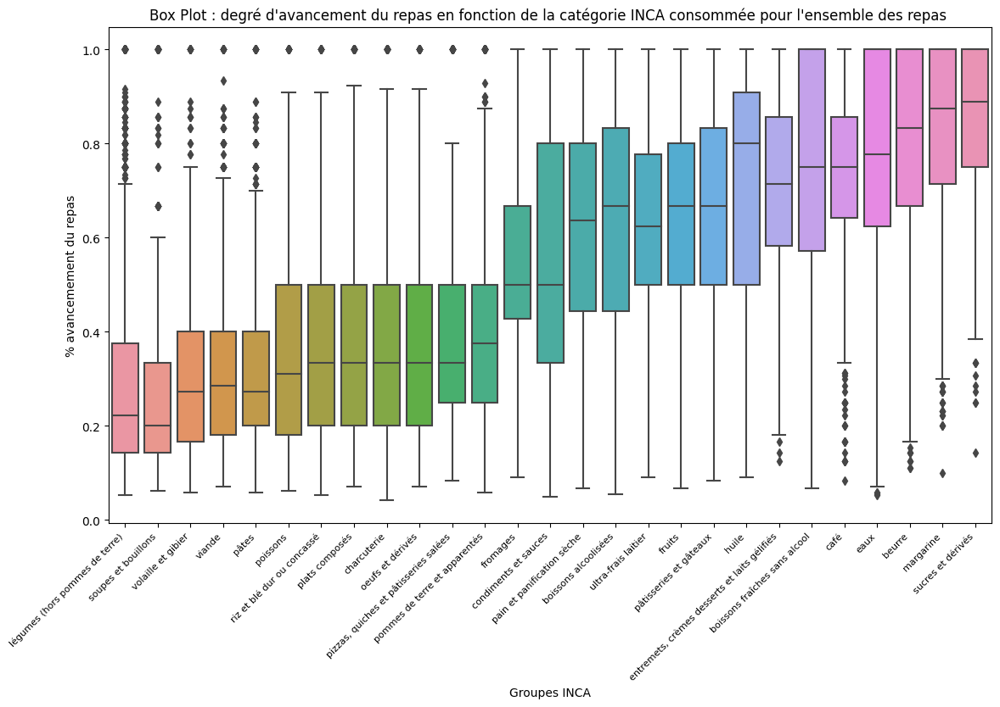

In [41]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Exemple de dictionnaire avec des données catégoriques
donnees = place_repas

# Aplatir les listes contenues dans le dictionnaire
donnees_aplaties = [(cle, valeur) for cle, valeurs in donnees.items() for valeur in valeurs]


# Créer un DataFrame Pandas à partir des données aplaties
df = pd.DataFrame(donnees_aplaties, columns=['Groupes INCA', '% avancemement du repas'])


# Créer un box plot avec Seaborn
plt.figure(figsize=(13, 9))
ax = sns.boxplot(data=df, x='Groupes INCA', y='% avancemement du repas', order=clés_triées)
plt.xticks(rotation=45, ha='right')
plt.xticks(fontsize=8)

ax.set_position([0.1, 0.25, 0.8, 0.65])

# Ajouter un titre au graphique
plt.title("Box Plot : degré d'avancement du repas en fonction de la catégorie INCA consommée pour l'ensemble des repas ")

plt.savefig('box_plot_ensemble_repas_reels.pdf', format='pdf')

# Afficher le box plot
plt.show()






In [42]:
#adaptation avec user embedding intégré à chaque étape LE USER EMBEDDING EST LA REPRENSENTATION DU USER DANS L ESPACE LATENT APPRISE PAR BPR

def pred_and_real_meal(preprocessor, model):
  model = model.to(device)
  loss = nn.CrossEntropyLoss(ignore_index=preprocessor.pad_index)  # classification avec une classe qui ne retourne pas d'erreur
  model.eval()
  rep_all_pred=[]
  rep_all_reel=[]
  with torch.no_grad():
      for batch in test_loader:
          rep_pred=[]
          rep_reel=[]
          sequences, user_index = batch
          x = preprocessor.process_batch(sequences).to(device)
          user_index = user_index.to(device)
          x_old, y_old = x[:-1], x[1:]
          yhat_old, hidden = model(x_old, user_index)
          x, y = x_old[:-1], y_old[:-1]
          yhat = yhat_old[:-1, :, :]
          # print(yhat.shape)
          predicted_classes = torch.argmax(yhat, dim=2)
          for i in range(len(predicted_classes)):
            predicted = predicted_classes[i]
            # print(predicted.item())
            y_val=y[i]
            # print(y_val.item())
            if predicted !=3:
              decoded_class = preprocessor.decode([predicted.item()])# Appel de decode pour chaque élément individuellement
              decoded_y= preprocessor.decode([y_val.item()])
              rep_pred.append(decoded_class)
              rep_reel.append(decoded_y)
          rep_all_pred.append(rep_pred)
          rep_all_reel.append(rep_reel)
  return rep_all_pred, rep_all_reel

rep_all_pred, rep_all_reel = pred_and_real_meal(preprocessor, rnn_model)
print(rep_all_pred)
print(rep_all_reel)

[['9811', '9811', '7001', '18008', '18008'], ['9811', '9811'], ['25902', '90068', '13039'], ['25902', '28916', '28916', '5210', '5210', '5210', '81008', '81008', '81009', '81009'], ['25902', '25604', '11110', '7001'], ['25604', '18066'], ['25902', '18066', '18066', '18066'], ['25902', '25604', '18066', '18066'], ['25902', '7001', '7001'], ['9811', '11017', '4010'], ['7001', '7001', '7001', '7001', '7001', '81024', '81024', '81024', '81024', '81024', '81025'], ['25902', '7001'], ['25902', '7001', '18066', '18066', '18066', '18066'], ['25902', '9104', '7001', '7001', '7001', '7001', '7001'], ['9811', '25604', '9811', '18066'], ['9811', '9811', '13039'], ['18066', '18066', '7001', '7001'], ['7001', '7001', '7001', '7001', '18066'], ['25604', '18066', '18066', '18004', '18004'], ['25902', '9811', '13039', '13039'], ['25902', '18004', '18004'], ['7001', '28916'], ['25902', '9811', '28916'], ['9104', '11108', '9104', '9104', '18066', '18066'], ['25902', '4003', '11018', '4003', '19606', '400

In [53]:
pred_rep_food_groups_testset=[]
for repas in rep_all_pred:
  r=[]
  for e in repas:
    r.append(dic_alim_group[int(e.replace("'",""))])
  pred_rep_food_groups_testset.append(r)
print(pred_rep_food_groups_testset)

[[3, 3, 1, 31, 31], [3, 3], [38, 11, 26], [38, 20, 20, 33, 33, 33, 13, 13, 13, 13], [38, 23, 43, 1], [23, 31], [38, 31, 31, 31], [38, 23, 31, 31], [38, 1, 1], [3, 43, 24], [1, 1, 1, 1, 1, 14, 14, 14, 14, 14, 14], [38, 1], [38, 1, 31, 31, 31, 31], [38, 4, 1, 1, 1, 1, 1], [3, 23, 3, 31], [3, 3, 26], [31, 31, 1, 1], [1, 1, 1, 1, 31], [23, 31, 31, 34, 34], [38, 3, 26, 26], [38, 34, 34], [1, 20], [38, 3, 20], [4, 43, 4, 4, 31, 31], [38, 24, 43, 24, 10, 24], [3, 34, 34, 34, 34, 34], [23, 31, 31, 1, 1, 31, 31, 31, 31, 30], [38, 1, 1], [38, 20, 24, 33, 33, 33, 30], [3, 1, 3], [38, 26, 31, 31], [23, 17, 34, 34], [38, 1], [38, 20, 26], [23, 11, 31, 31, 31], [38, 26, 23, 26, 26, 33, 26, 14, 14, 14, 14], [38, 20, 1, 1, 1, 43, 26, 26, 31, 31], [31, 31, 31], [23, 23, 23, 26], [38, 1, 1, 1, 1, 1, 1, 1], [3, 3, 1, 1, 1], [23, 23, 31], [20, 43, 1, 1, 1, 1, 1, 1], [38, 3, 1, 1, 1], [38, 4, 1, 1], [3, 20, 31], [23, 23, 23, 43], [38, 14, 14], [20, 20, 1], [1, 24, 1, 31, 13, 30], [36, 23, 23, 23], [3, 3, 3

In [54]:
reel_rep_food_groups_testset=[]
for repas in rep_all_reel:
  r=[]
  for e in repas:
    r.append(dic_alim_group[int(e.replace("'",""))])
  reel_rep_food_groups_testset.append(r)
print(reel_rep_food_groups_testset)

[[17, 23, 1, 41, 31], [31, 26], [38, 11, 26], [1, 23, 17, 24, 11, 26, 33, 14, 13, 13], [12, 23, 11, 33], [39, 31], [36, 23, 43, 31], [36, 11, 1, 31], [38, 8, 31], [4, 17, 31], [31, 14, 4, 21, 4, 12, 23, 11, 26, 14, 14], [39, 33], [20, 1, 38, 8, 10, 31], [38, 21, 39, 14, 43, 26, 31], [12, 13, 1, 32], [38, 26, 30], [38, 31, 20, 1], [23, 10, 17, 1, 31], [17, 3, 31, 8, 43], [17, 31, 23, 23], [26, 26, 34], [4, 43], [17, 1, 11], [23, 21, 24, 11, 26, 31], [23, 14, 24, 23, 17, 31], [8, 3, 23, 11, 43, 14], [21, 23, 23, 23, 1, 43, 43, 10, 31, 30], [26, 34, 30], [23, 17, 24, 31, 1, 10, 30], [31, 18, 26], [12, 26, 10, 31], [3, 31, 23, 13], [39, 33], [38, 1, 33], [3, 11, 26, 26, 31], [23, 18, 43, 1, 23, 33, 31, 14, 43, 23, 14], [3, 20, 23, 23, 43, 11, 15, 1, 11, 33], [20, 23, 31], [17, 23, 10, 26], [33, 20, 23, 43, 17, 3, 33, 15], [12, 23, 31, 32, 1], [18, 24, 31], [23, 14, 43, 43, 10, 23, 23, 21], [17, 23, 10, 11, 26], [39, 4, 41, 13], [26, 20, 31], [31, 20, 23, 10], [24, 11, 10], [20, 10, 33], [1

In [55]:
# import itertools
# from itertools import chain

# Aplatir la liste de listes en une seule liste
liste_pred_aplatie = list(chain(*pred_rep_food_groups_testset))

# Identifier les valeurs uniques
valeurs_uniques_pred = set(liste_pred_aplatie)
print(valeurs_uniques_pred)


place_repas_pred={}
for g in valeurs_uniques_pred:
  place_repas_pred[dic_group[g]]=[]

for repas in pred_rep_food_groups_testset:
  for g in repas:
    place_repas_pred[dic_group[g]].append((repas.index(g)+1)/len(repas))
print(place_repas_pred)

place_moy_repas_pred={}
for g in list(place_repas_pred.keys()):
  place_moy_repas_pred[g]=round(sum(place_repas_pred[g])/len(place_repas_pred[g]),3)
print(place_moy_repas_pred)


x=[]
y=[]
for cle,valeur in place_repas_pred.items():
  for e in valeur:
    x.append(cle)
    y.append(valeur)
print(x[:20])
print(y[:20])

clés_triées_pred = sorted(place_moy_repas_pred, key=lambda clé: place_moy_repas_pred[clé])
print(clés_triées_pred)

{1, 3, 4, 10, 11, 12, 13, 14, 15, 17, 18, 20, 21, 23, 24, 26, 30, 31, 32, 33, 34, 36, 38, 39, 43}
{'pain et panification sèche': [0.6, 1.0, 0.6666666666666666, 0.6666666666666666, 0.09090909090909091, 0.09090909090909091, 0.09090909090909091, 0.09090909090909091, 0.09090909090909091, 1.0, 0.3333333333333333, 0.42857142857142855, 0.42857142857142855, 0.42857142857142855, 0.42857142857142855, 0.42857142857142855, 0.75, 0.75, 0.2, 0.2, 0.2, 0.2, 0.5, 0.4, 0.4, 0.6666666666666666, 0.6666666666666666, 0.6666666666666666, 1.0, 0.3, 0.3, 0.3, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.6, 0.6, 0.6, 0.375, 0.375, 0.375, 0.375, 0.375, 0.375, 0.6, 0.6, 0.6, 0.75, 0.75, 1.0, 0.16666666666666666, 0.16666666666666666, 1.0, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.5, 0.5, 0.8, 0.8, 1.0, 0.2, 0.2, 0.2, 1.0, 0.5, 0.6, 0.6, 0.6, 0.2857142857142857, 0.2857142857142857, 0.2857142857142857, 0.2857142857142857, 0.2857142857142857, 1.0, 0.5, 0.5, 

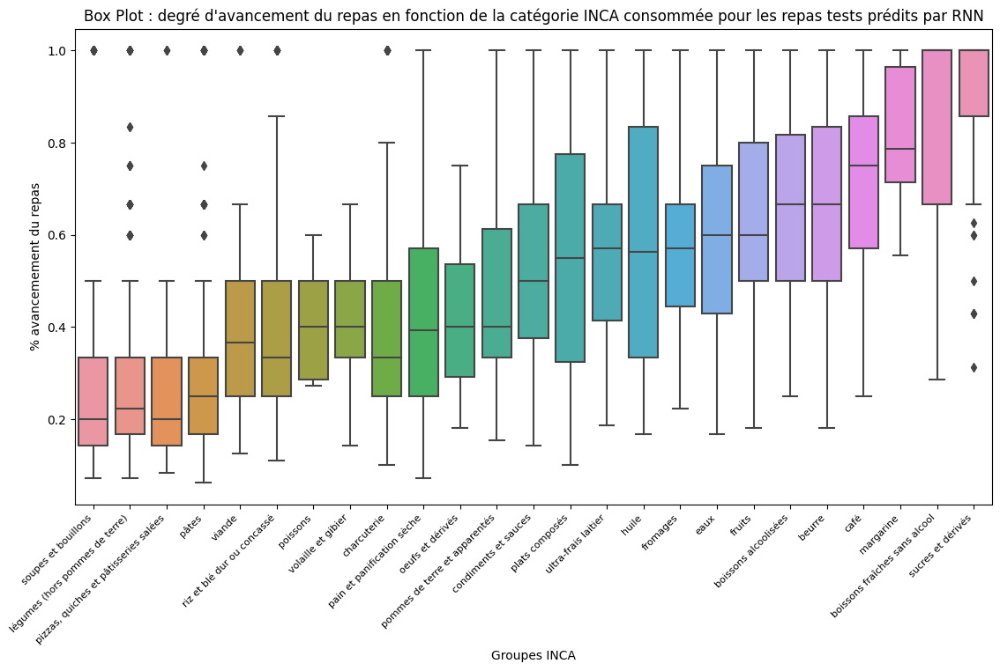

In [56]:

# Exemple de dictionnaire avec des données catégoriques
donnees = place_repas_pred

# Aplatir les listes contenues dans le dictionnaire
donnees_aplaties = [(cle, valeur) for cle, valeurs in donnees.items() for valeur in valeurs]


# Créer un DataFrame Pandas à partir des données aplaties
df = pd.DataFrame(donnees_aplaties, columns=['Groupes INCA', '% avancemement du repas'])


# Créer un box plot avec Seaborn
plt.figure(figsize=(13, 9))
ax = sns.boxplot(data=df, x='Groupes INCA', y='% avancemement du repas', order=clés_triées_pred)
plt.xticks(rotation=45, ha='right')
plt.xticks(fontsize=8)

ax.set_position([0.1, 0.3, 0.8, 0.6])

# Ajouter un titre au graphique
plt.title("Box Plot : degré d'avancement du repas en fonction de la catégorie INCA consommée pour les repas tests prédits par RNN")

plt.savefig('box_plot_repas_test_preditsRNN.pdf', format='pdf')

# Afficher le box plot
plt.show()




In [57]:

# Aplatir la liste de listes en une seule liste
liste_reel_aplatie = list(chain(*reel_rep_food_groups_testset))

# Identifier les valeurs uniques
valeurs_uniques_reel = set(liste_reel_aplatie)
print(valeurs_uniques_reel)


place_repas_reel={}
for g in valeurs_uniques_reel:
  place_repas_reel[dic_group[g]]=[]

for repas in reel_rep_food_groups_testset:
  for g in repas:
    place_repas_reel[dic_group[g]].append((repas.index(g)+1)/len(repas))
print(place_repas_reel)

place_moy_repas_reel={}
for g in list(place_repas_reel.keys()):
  place_moy_repas_reel[g]=round(sum(place_repas_reel[g])/len(place_repas_reel[g]),3)
print(place_moy_repas_reel)


x=[]
y=[]
for cle,valeur in place_repas_reel.items():
  for e in valeur:
    x.append(cle)
    y.append(valeur)
print(x[:20])
print(y[:20])

clés_triées_reel = sorted(place_moy_repas_reel, key=lambda clé: place_moy_repas_reel[clé])
print(clés_triées_reel)

{1, 3, 4, 8, 10, 11, 12, 13, 14, 15, 17, 18, 20, 21, 23, 24, 26, 30, 31, 32, 33, 34, 36, 38, 39, 41, 43}
{'pain et panification sèche': [0.6, 0.1, 0.75, 0.3333333333333333, 0.75, 1.0, 0.8, 0.6666666666666666, 0.5, 0.7142857142857143, 0.6666666666666666, 0.36363636363636365, 0.8, 1.0, 0.5, 0.25, 1.0, 1.0, 1.0, 1.0, 0.5, 0.8, 0.7142857142857143, 0.5, 0.6666666666666666, 0.75, 1.0, 0.1, 0.3333333333333333, 0.5, 0.42857142857142855, 0.8571428571428571, 0.5, 0.3333333333333333, 0.75, 0.3333333333333333, 0.625, 0.5, 1.0, 0.7142857142857143, 0.8571428571428571, 0.8, 0.5833333333333334, 0.7777777777777778, 0.2857142857142857, 0.75, 0.8, 0.5714285714285714, 0.4444444444444444, 0.75, 0.6666666666666666, 0.875, 0.7142857142857143, 0.8571428571428571, 0.8571428571428571, 0.75, 0.6666666666666666, 0.5714285714285714, 0.75, 0.6666666666666666, 1.0, 0.5, 0.8, 0.2727272727272727, 0.2727272727272727, 0.75, 0.6666666666666666, 0.625, 0.42857142857142855, 1.0, 0.8, 0.8, 0.125, 0.8571428571428571, 0.7, 0.

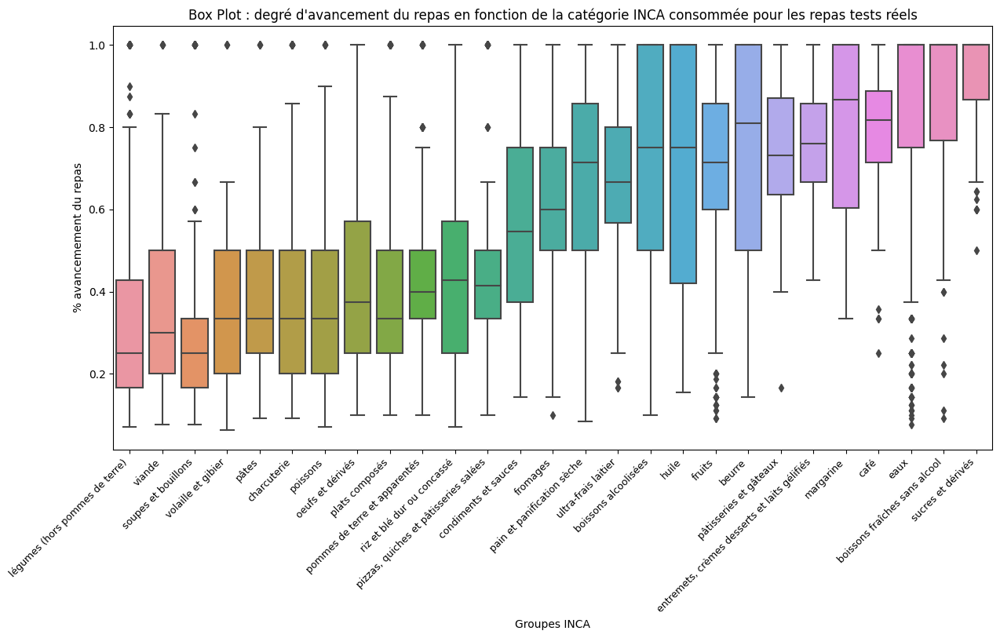

In [58]:
# Exemple de dictionnaire avec des données catégoriques
donnees = place_repas_reel

# Aplatir les listes contenues dans le dictionnaire
donnees_aplaties = [(cle, valeur) for cle, valeurs in donnees.items() for valeur in valeurs]


# Créer un DataFrame Pandas à partir des données aplaties
df = pd.DataFrame(donnees_aplaties, columns=['Groupes INCA', '% avancemement du repas'])


# Créer un box plot avec Seaborn
plt.figure(figsize=(14, 9))
ax = sns.boxplot(data=df, x='Groupes INCA', y='% avancemement du repas', order=clés_triées_reel)
plt.xticks(rotation=45, ha='right')
plt.xticks(fontsize=9)

ax.set_position([0.1, 0.3, 0.8, 0.6])

# Ajouter un titre au graphique
plt.title("Box Plot : degré d'avancement du repas en fonction de la catégorie INCA consommée pour les repas tests réels")

plt.savefig('box_plot_repas_test_reels.pdf', format='pdf')

# Afficher le box plot
plt.show()


In [59]:
print(place_moy_repas_reel['huile'])
print(place_moy_repas_reel['margarine'])
print(place_moy_repas_reel['beurre'])


0.689
0.797
0.747


In [ ]:
# identifier les groupes des aliments dont l'ordre n'est pas donné dans le carnet de recueil ("pas de noligne" et qui sont renseignés à la fin du repas)
pas_num_ligne=[81007, 81047, 81025, 81024, 81061, 81006, 81045, 81009, 81029, 81052, 81022, 81067,
               81032, 81012, 81008, 81000, 81010, 81073, 81002, 81014, 81011, 81038, 81040, 81035,
               81034, 81015, 81063, 81042, 81043, 81039, 81023, 81020, 81064, 81055, 81013, 81037,
               81028, 81036, 81075, 81044, 81031, 81003, 81016, 81046, 81021, 81001, 81005, 81069,
               1041, 81066, 81018, 81071, 81051, 81017, 81081, 81087, 81088, 81030, 81059, 81033, 81086, 81057]

nombre={}
for groupe in range(45):
  nombre[groupe]=0

for a in pas_num_ligne:
  if a in dic_alim:
    print(dic_alim[a])
  if a in dic_alim_group:
    nombre[dic_alim_group[a]]+=1
# print(nombre)

for cle, valeur in nombre.items():
  if valeur >0:
    print(dic_group[cle], ":", valeur)

beurre allégé ajouté à la cuisson
margarine type primevère 60% m.g. ajoutée à la cuisson
huile d'olive ajoutée au service
huile d'olive ajoutée à la cuisson
vinaigrette ajoutée au service
beurre allégé ajouté au service
margarine proactiv de fruit d'or ajoutée à la cuisson
beurre doux non allégé ajoutée au service
huile mélangée (type isio 4) ajoutée à la cuisson
sucre blanc ajouté au service
huile de tournesol ajoutée à la cuisson
confiture ajoutée au service
margarine allégée demi-sel 40% m.g. ajoutée au service
huile d'arachide ajoutée à la cuisson
beurre doux non allégé ajouté à la cuisson
crème fraîche allégée ajoutée au service
beurre salé non allégé ajoutée au service
huile de paraffine ajoutée au service
crème fraîche non allégée ajoutée au service
huile de colza ajoutée au service
beurre salé non allégé ajouté à la cuisson
margarine au tournesol  70% ou 80% m.g. ajoutée à la cuisson
margarine ordinaire  60% m.g. ajoutée à la cuisson
margarine allégée  40% m.g. ajoutée à la cui

{'pain et panification sèche': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

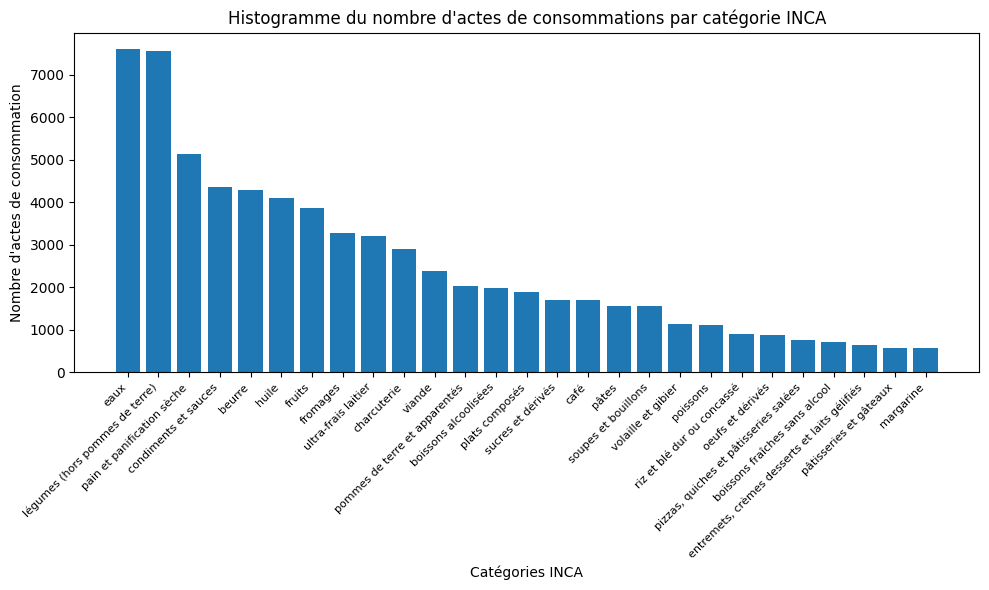

In [ ]:
# Histogramme du nombre de consommation par catégorie INCA sur l'ensemble des repas réels

# import itertools
# from itertools import chain

nombre_conso={}
for g in valeurs_uniques:
  nombre_conso[dic_group[g]]=[]

for repas in rep_food_groups:
  for g in repas:
    nombre_conso[dic_group[g]].append(1)
print(nombre_conso)

nombre_conso_sum={}
for g in list(nombre_conso.keys()):
  nombre_conso_sum[g]=(sum(nombre_conso[g]))
print(nombre_conso_sum)

x=[]
y=[]
for cle,valeur in nombre_conso_sum.items():
    x.append(cle)
    y.append(valeur)
print(x[:20])
print(y[:20])

# Trier les données par ordre décroissant en fonction de y
x_sorted, y_sorted = zip(*sorted(zip(x, y), key=lambda x: x[1], reverse=True))

# Créer un histogramme
plt.figure(figsize=(10, 6))
plt.bar(x_sorted, y_sorted)

# Ajouter des étiquettes et un titre
plt.xlabel("Catégories INCA")
plt.ylabel("Nombre d'actes de consommation")
plt.title("Histogramme du nombre d'actes de consommations par catégorie INCA")

# Ajuster l'espacement entre les étiquettes de l'axe des x pour éviter le chevauchement
plt.xticks(rotation=45, ha='right', fontsize=8)

plt.tight_layout()

plt.savefig('box_plot_nombre_conso.pdf', format='pdf')

# Afficher l'histogramme
plt.show()